In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with all noise sources added and with reducing measurement noise and dust strength by order of magnitude (improvement_factor=10, effect_strength=10) (simulation=11)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['1','1','1','1','1']
improvement_factor=10
effect_strength=10
chance_companion=0.01
remove_likely_binaries='1'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


394.42 4.8e-05


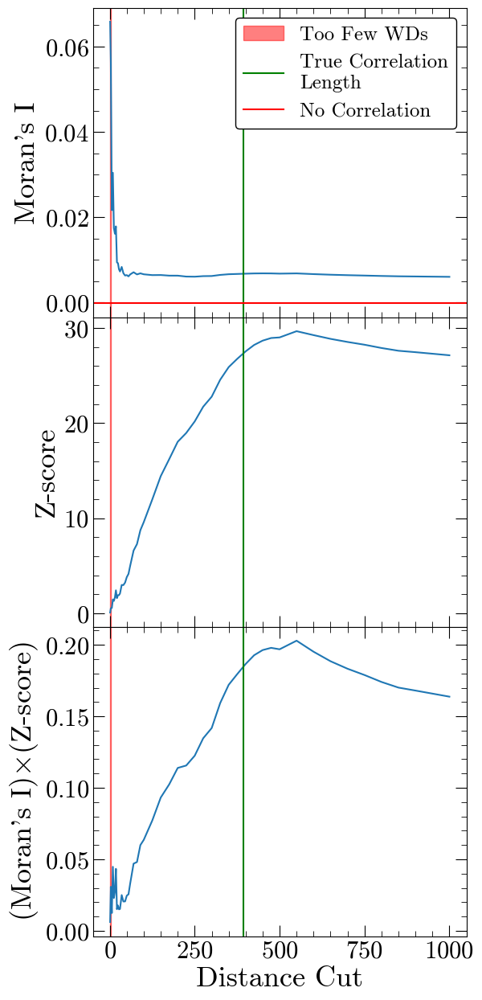

756.46 1.6e-05


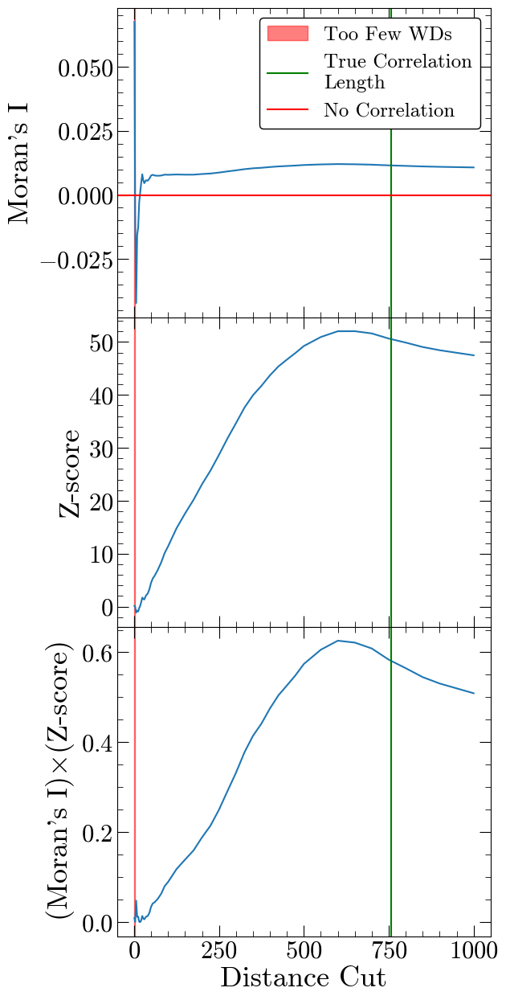

21.07 6.2e-07


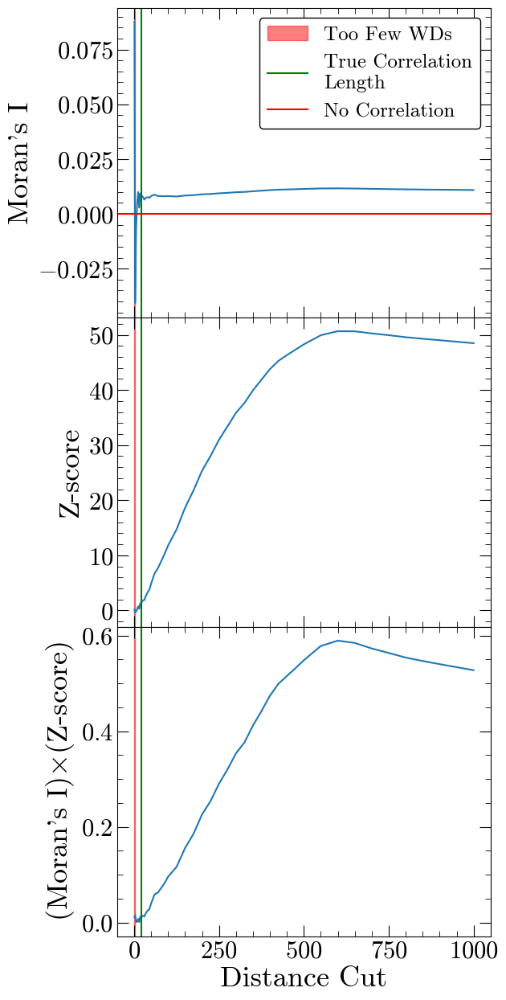

129.15 0.23


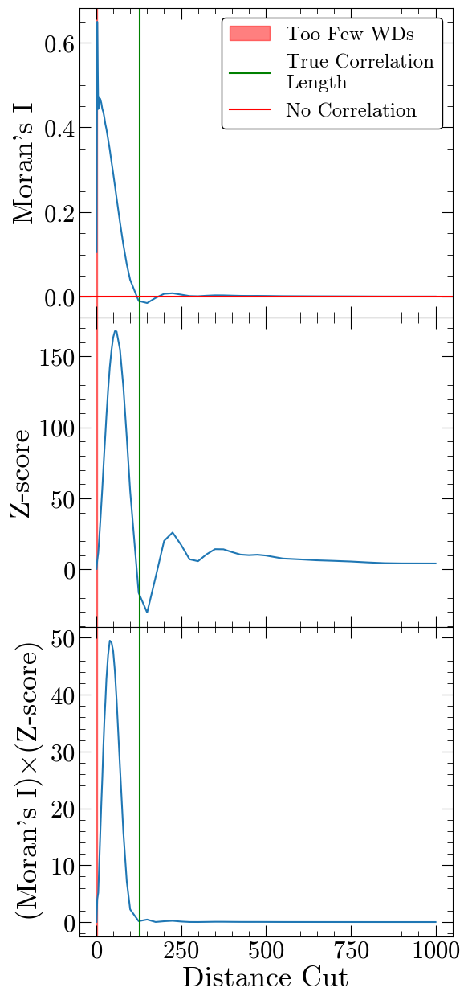

509.41 0.034


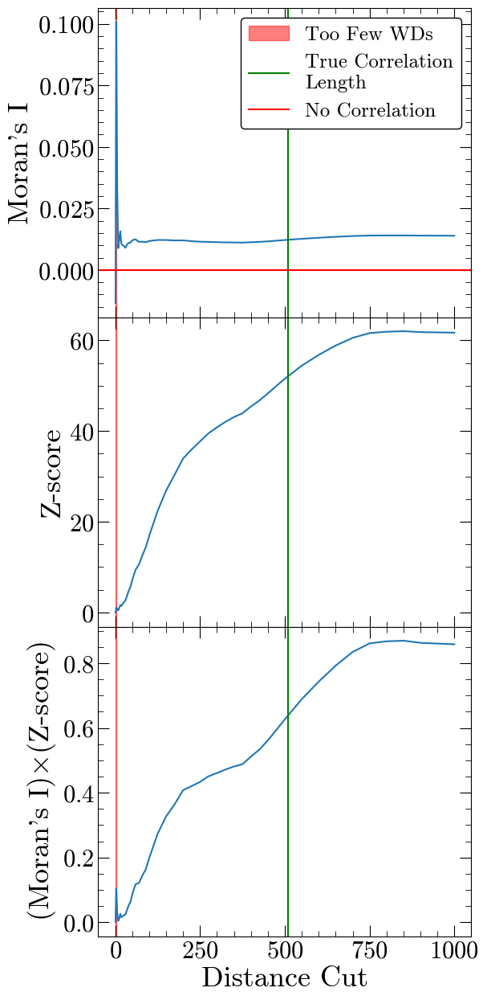

84.62 0.23


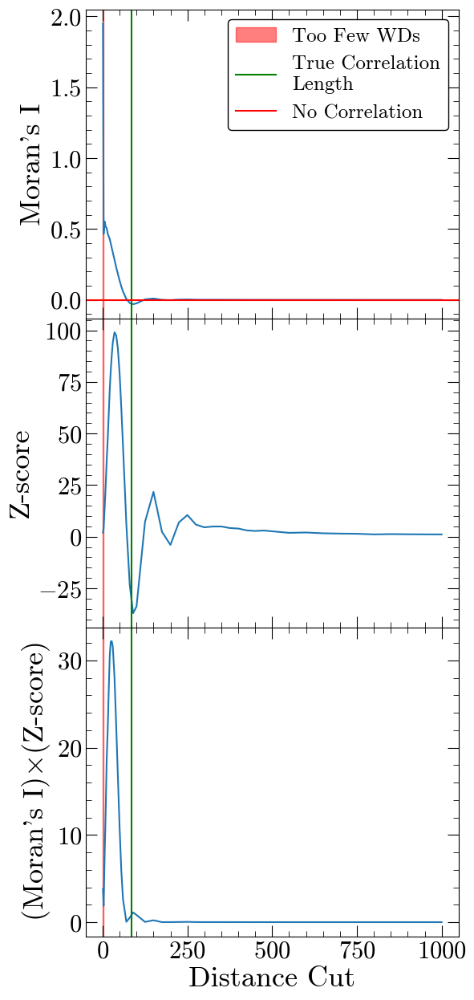

673.42 1.6e-05


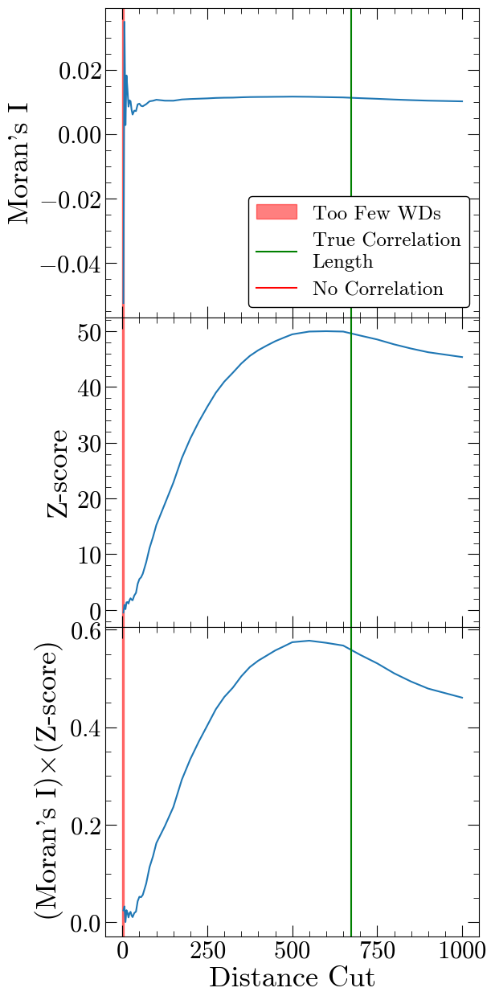

932.6 0.00014


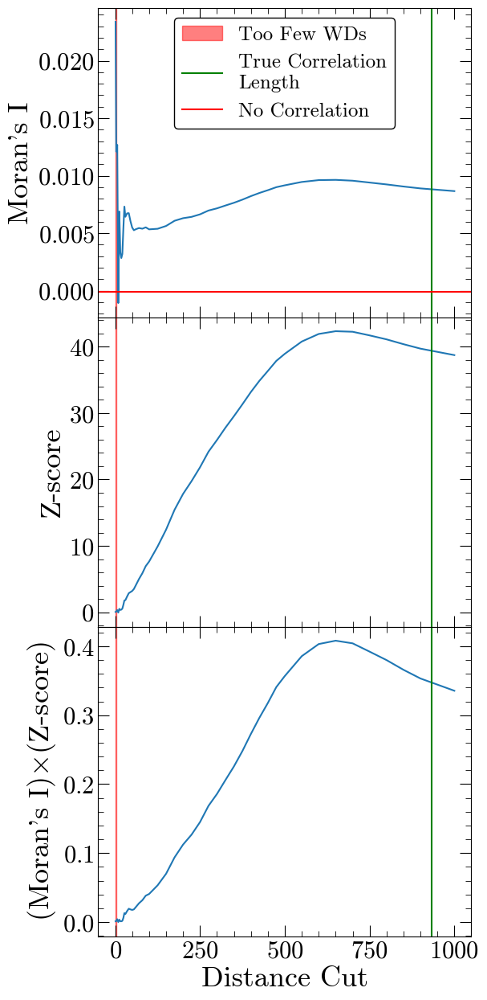

242.01 0.0013


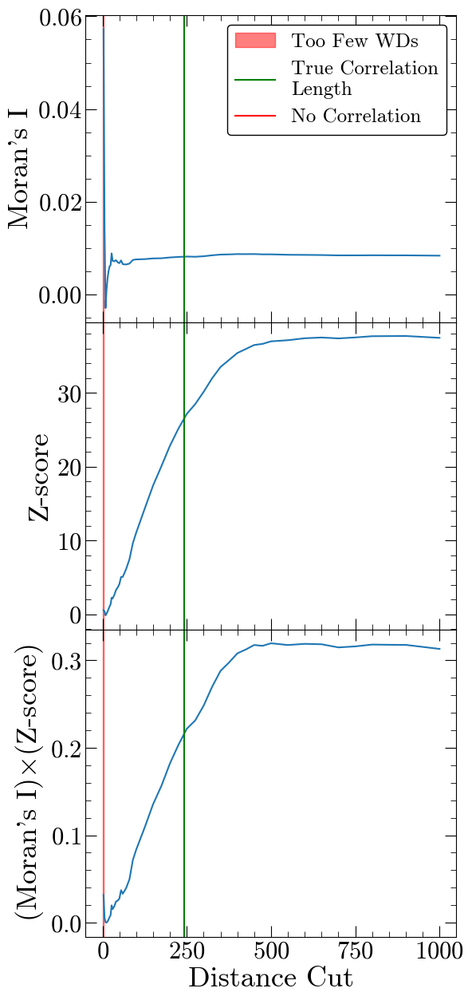

486.26 2.1e-07


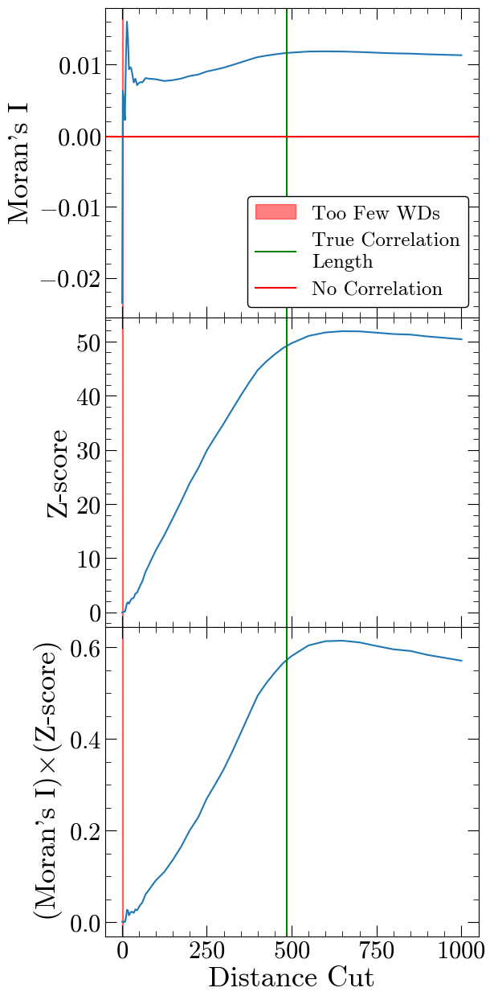

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

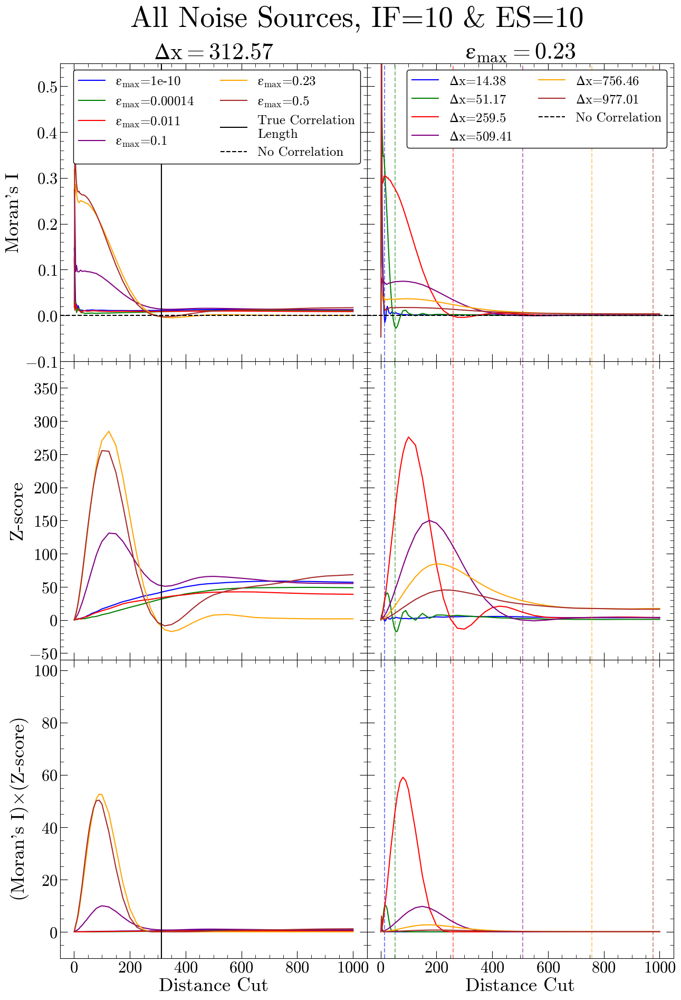

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.1,0.23,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.23
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.1,0.55)
ax4.set_ylim(-0.1,0.55)

ax2.set_ylim(-60,390)
ax5.set_ylim(-60,390)

ax3.set_ylim(-10,104)
ax6.set_ylim(-10,104)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('All Noise Sources, IF=10 & ES=10', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_all_noise_IF10_ES10.pdf', dpi=300)#, pad_inches=0.3)

(0.0, 2.0)

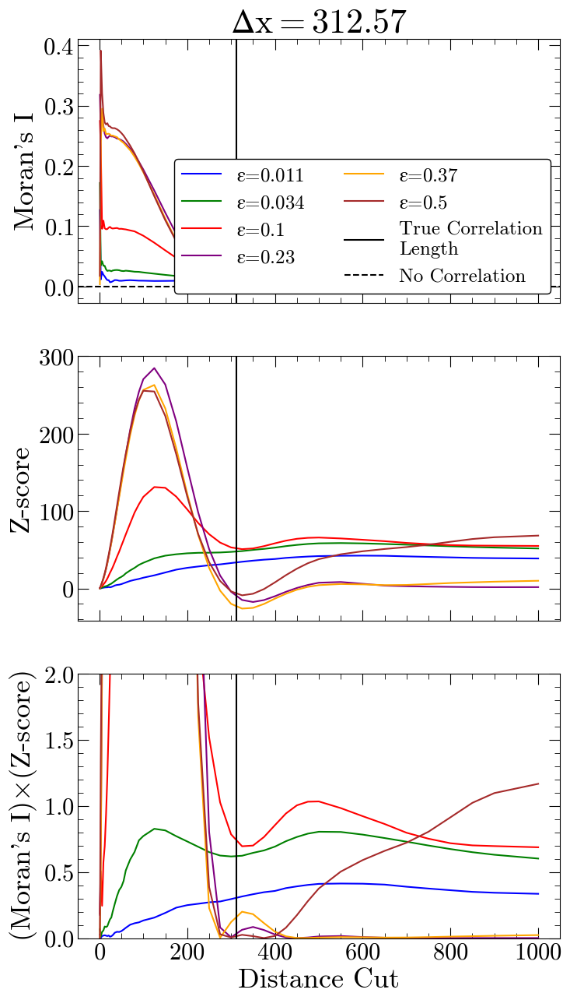

In [8]:
#find minimum visible epsilon

#min=0.034
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.011,0.034,0.1,0.23,0.37,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))

ax3.set_ylim(0,2)
 

# Set up the training and testing data for the CNN

In [13]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [14]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [15]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [16]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [17]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [31]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 0s 2ms/step - loss: 113821.7109
Epoch 2/100
92/92 [==============================] - 0s 2ms/step - loss: 66898.0078
Epoch 3/100
92/92 [==============================] - 0s 2ms/step - loss: 65523.1484
Epoch 4/100
92/92 [==============================] - 0s 2ms/step - loss: 64233.5156
Epoch 5/100
92/92 [==============================] - 0s 2ms/step - loss: 62992.9492
Epoch 6/100
92/92 [==============================] - 0s 2ms/step - loss: 62275.4688
Epoch 7/100
92/92 [==============================] - 0s 2ms/step - loss: 61854.9766
Epoch 8/100
92/92 [==============================] - 0s 2ms/step - loss: 61657.9414
Epoch 9/100
92/92 [==============================] - 0s 2ms/step - loss: 60993.2031
Epoch 10/100
92/92 [==============================] - 0s 2ms/step - loss: 61095.5156
Epoch 11/100
92/92 [==============================] - 0s 2ms/step - loss: 60620.5391
Epoch 12/100
92/92 [==============================] - 0s 2ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 239.680 pc
MAE: 174.535 pc
BIAS: -43.062 pc
MED FRAC ERR: 0.531 

Training Stats, Successful Fits
Frac Success Fit: 0.170 
RMSE: 18.475 pc
MAE: 9.556 pc
BIAS: 0.476 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 240.714 pc
MAE: 108.521 pc
BIAS: -2.229 pc
MED FRAC ERR: 0.245 

Testing Stats, Successful Fits
Frac Success Fit: 0.332 
RMSE: 17.753 pc
MAE: 6.525 pc
BIAS: -0.453 pc
MED FRAC ERR: 0.036 


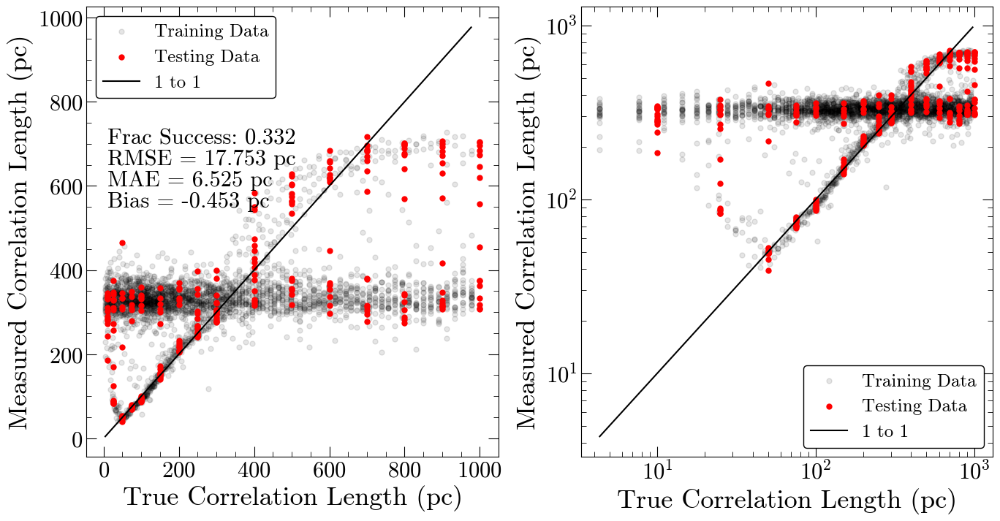

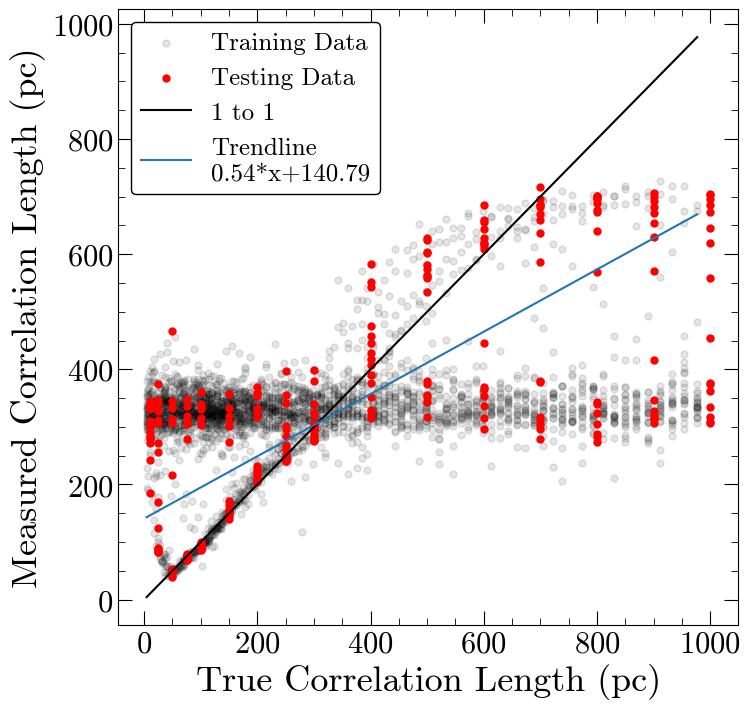

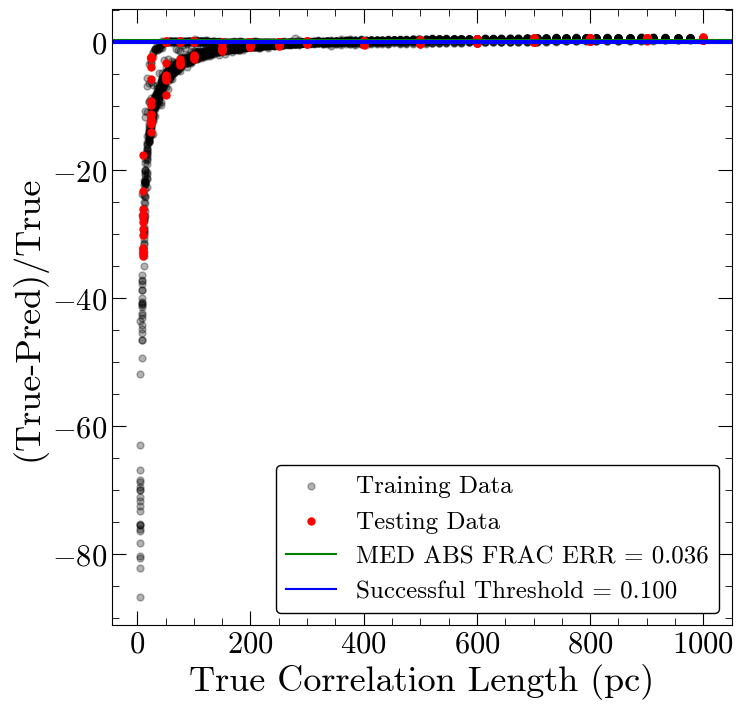

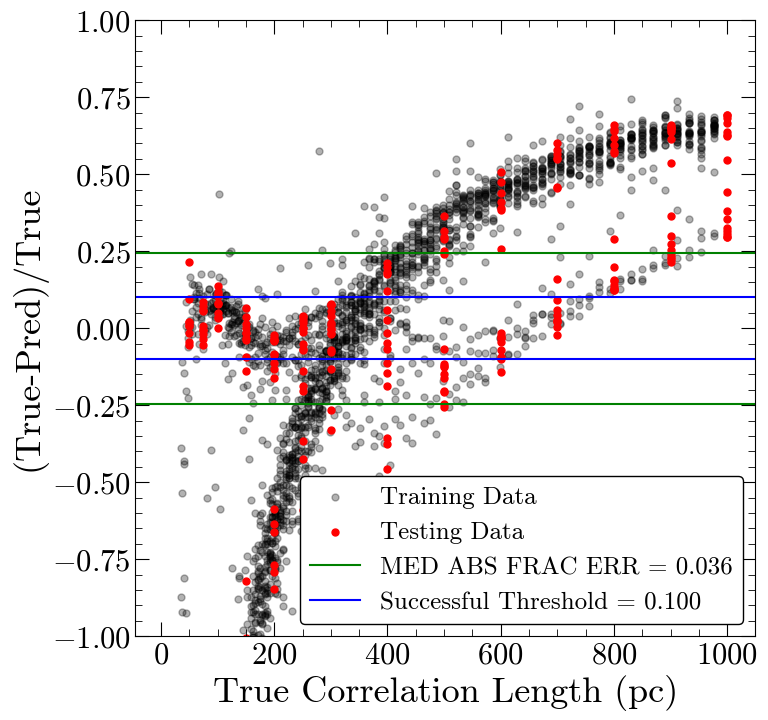

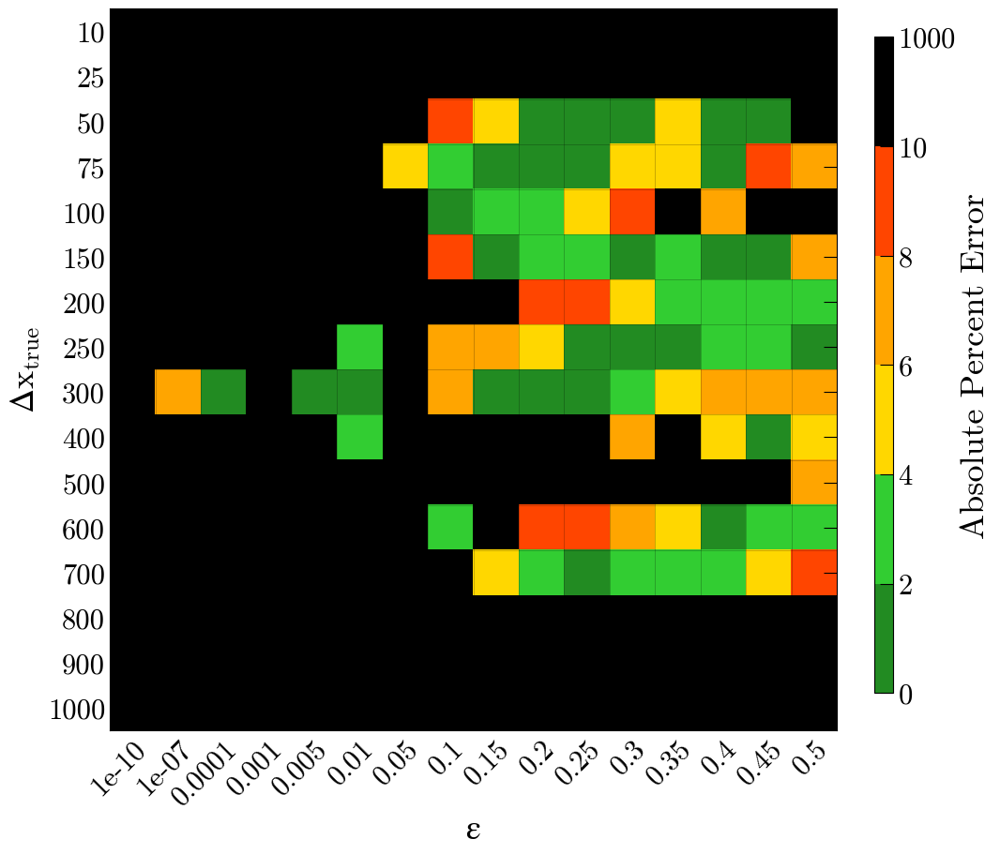

Number of squares with abs percent err>10%,  171


In [19]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 0s 3ms/step - loss: 114565.1797
Epoch 2/200
92/92 [==============================] - 0s 3ms/step - loss: 66643.6719
Epoch 3/200
92/92 [==============================] - 0s 3ms/step - loss: 65711.6562
Epoch 4/200
92/92 [==============================] - 0s 3ms/step - loss: 64711.5000
Epoch 5/200
92/92 [==============================] - 0s 3ms/step - loss: 63809.8086
Epoch 6/200
92/92 [==============================] - 0s 3ms/step - loss: 62981.9102
Epoch 7/200
92/92 [==============================] - 0s 3ms/step - loss: 62266.2656
Epoch 8/200
92/92 [==============================] - 0s 3ms/step - loss: 61691.9375
Epoch 9/200
92/92 [==============================] - 0s 3ms/step - loss: 61338.5938
Epoch 10/200
92/92 [==============================] - 0s 3ms/step - loss: 61161.1875
Epoch 11/200
92/92 [==============================] - 0s 3ms/step - loss: 60856.6641
Epoch 12/200
92/92 [==============================] - 0s 3ms/step - loss:

92/92 [==============================] - 0s 2ms/step - loss: 56584.4297
Epoch 193/200
92/92 [==============================] - 0s 2ms/step - loss: 56299.1211
Epoch 194/200
92/92 [==============================] - 0s 3ms/step - loss: 56791.8047
Epoch 195/200
92/92 [==============================] - 0s 3ms/step - loss: 56323.4492
Epoch 196/200
92/92 [==============================] - 0s 3ms/step - loss: 56312.9961
Epoch 197/200
92/92 [==============================] - 0s 3ms/step - loss: 56294.2383
Epoch 198/200
92/92 [==============================] - 0s 4ms/step - loss: 56272.4062
Epoch 199/200
92/92 [==============================] - 0s 3ms/step - loss: 56932.0352
Epoch 200/200
92/92 [==============================] - 0s 3ms/step - loss: 56383.1680

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 236.944 pc
MAE: 156.785 pc
BIAS: -18.189 pc
MED FRAC ERR: 0.522 

Training Stats, Successful Fits
Frac Success Fit: 0.185 
RMSE: 20.292 pc
MAE: 9.955 pc
BIAS: 2.168 pc
MED FRAC ERR: 0.047 

Testing Stats
RMSE: 235.161 pc
MAE: 91.799 pc
BIAS: 0.504 pc
MED FRAC ERR: 0.187 

Testing Stats, Successful Fits
Frac Success Fit: 0.379 
RMSE: 16.791 pc
MAE: 7.161 pc
BIAS: 0.541 pc
MED FRAC ERR: 0.035 


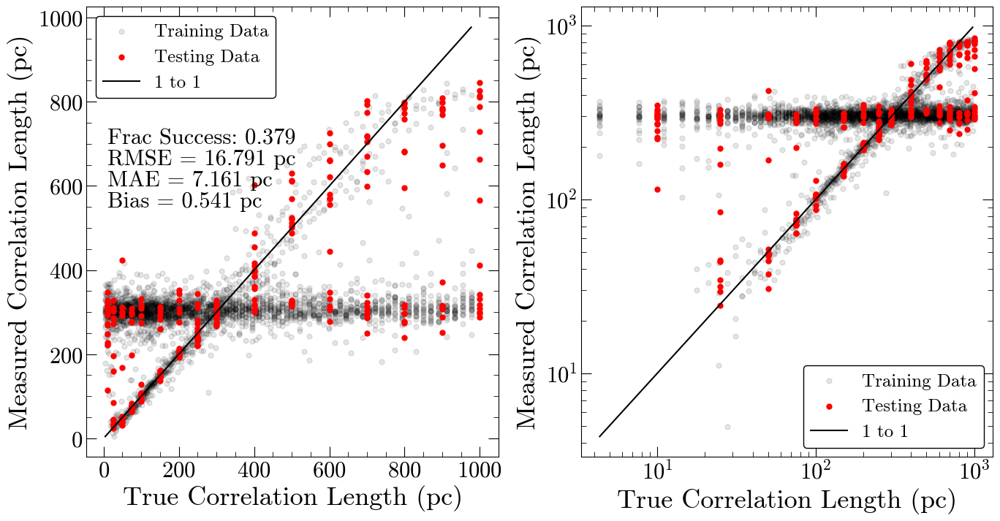

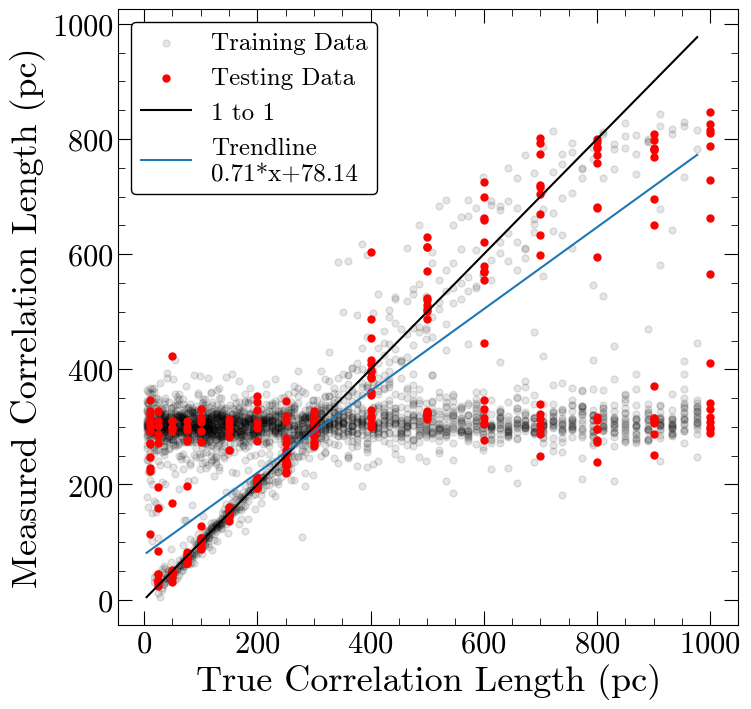

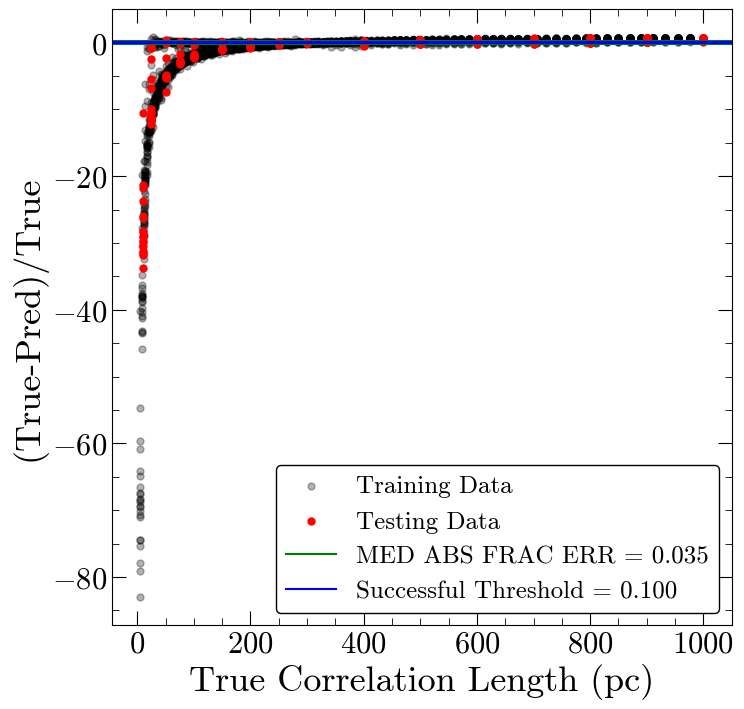

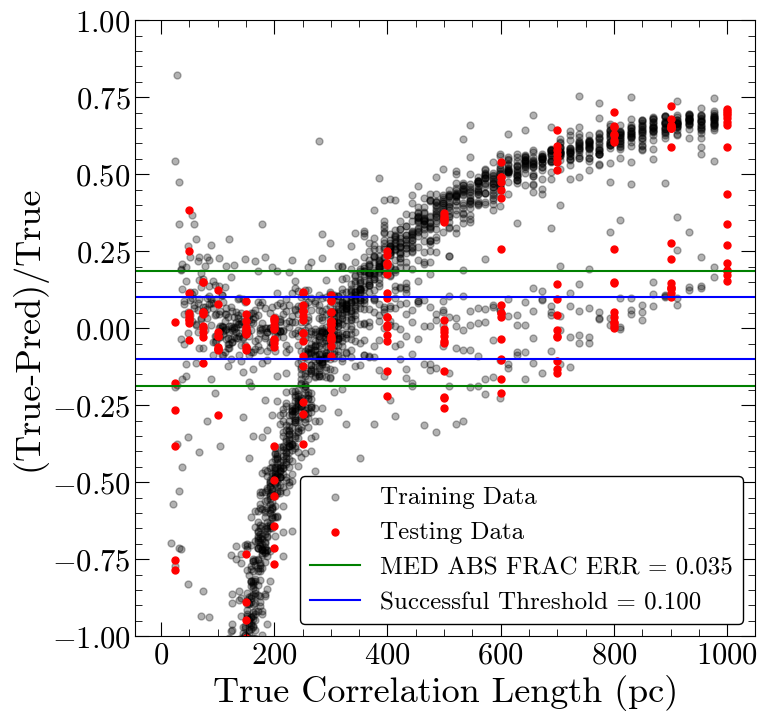

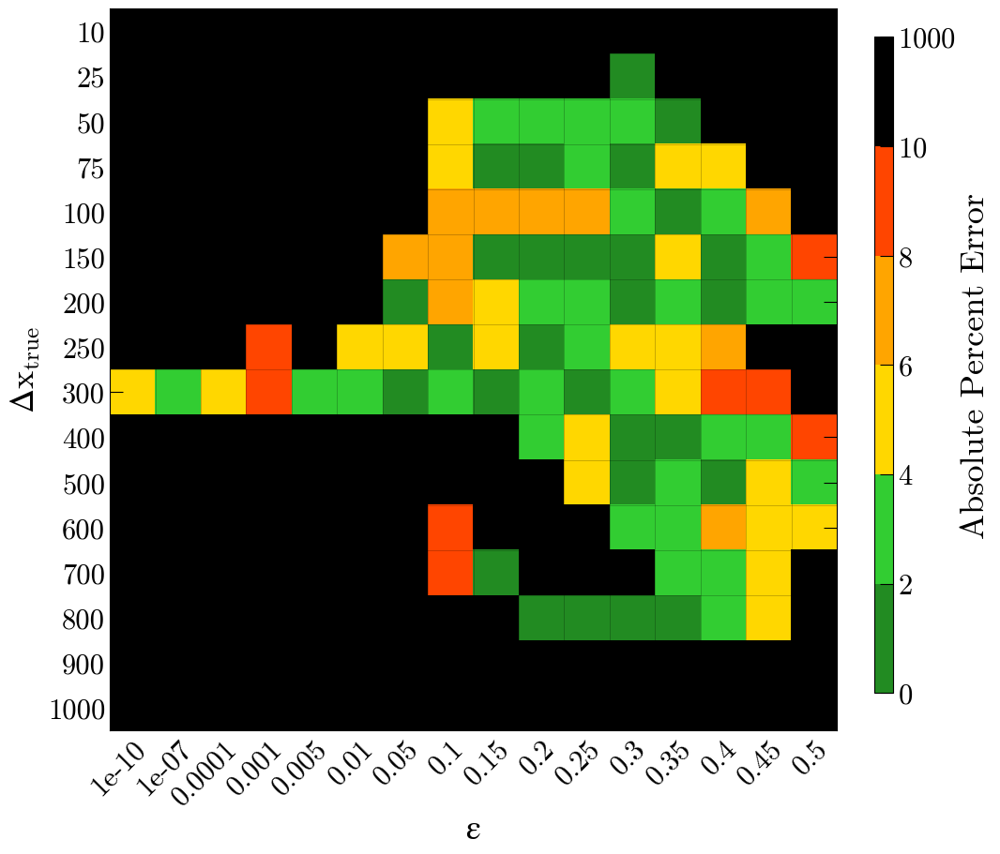

Number of squares with abs percent err>10%,  159


In [20]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 4ms/step - loss: 98048.1953
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 65722.2734
Epoch 3/100
92/92 [==============================] - 0s 5ms/step - loss: 64785.1719
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 63794.5312
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 63150.8984
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 62473.9570
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 62219.1914
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 60873.7656
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 61592.7461
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 60763.4922
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 60136.1797
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 237.010 pc
MAE: 166.284 pc
BIAS: -42.934 pc
MED FRAC ERR: 0.521 

Training Stats, Successful Fits
Frac Success Fit: 0.153 
RMSE: 19.678 pc
MAE: 11.157 pc
BIAS: -0.733 pc
MED FRAC ERR: 0.043 

Testing Stats
RMSE: 233.711 pc
MAE: 82.424 pc
BIAS: -12.951 pc
MED FRAC ERR: 0.229 

Testing Stats, Successful Fits
Frac Success Fit: 0.312 
RMSE: 26.887 pc
MAE: 10.640 pc
BIAS: -4.563 pc
MED FRAC ERR: 0.038 


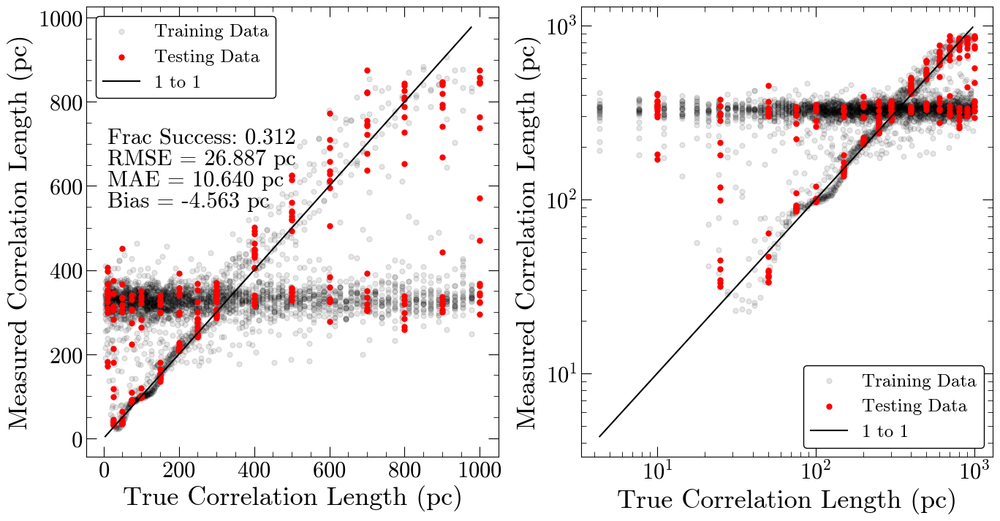

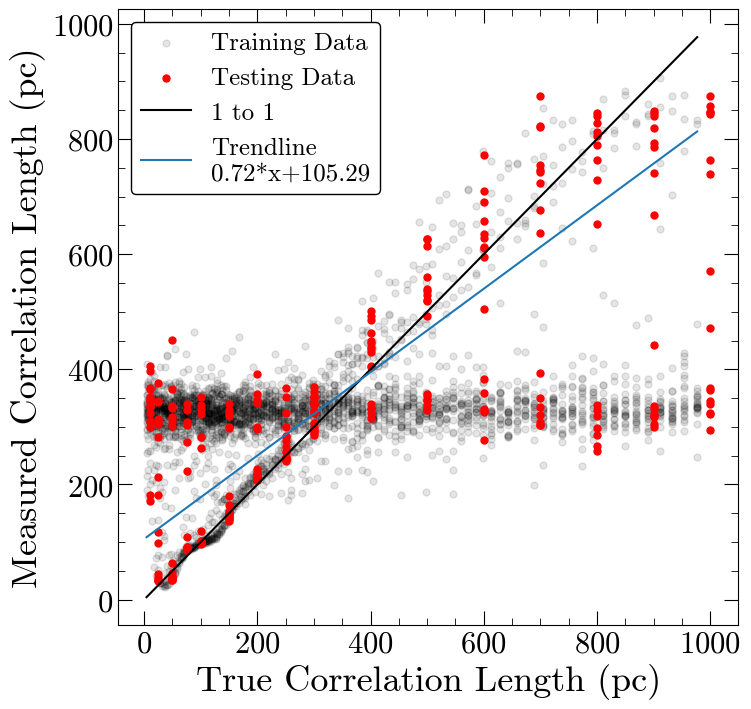

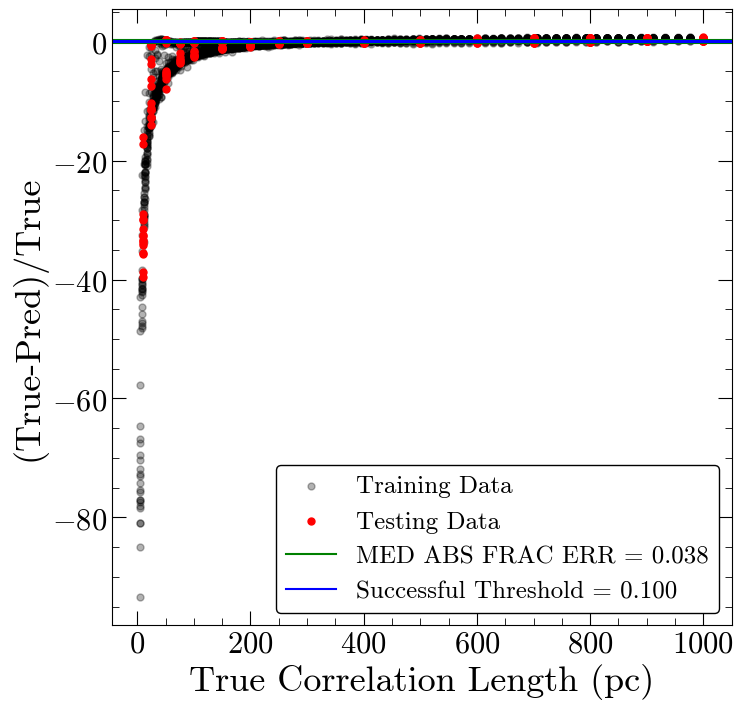

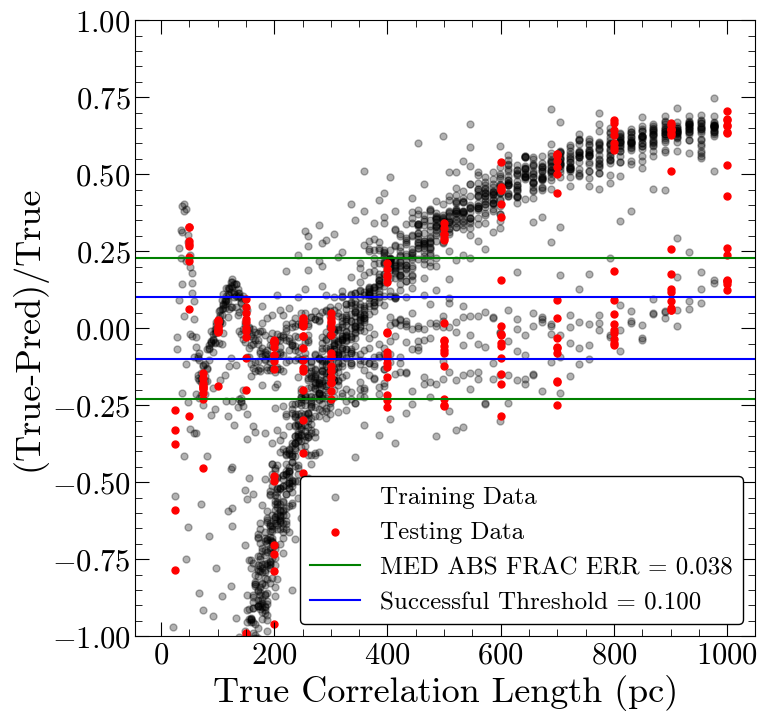

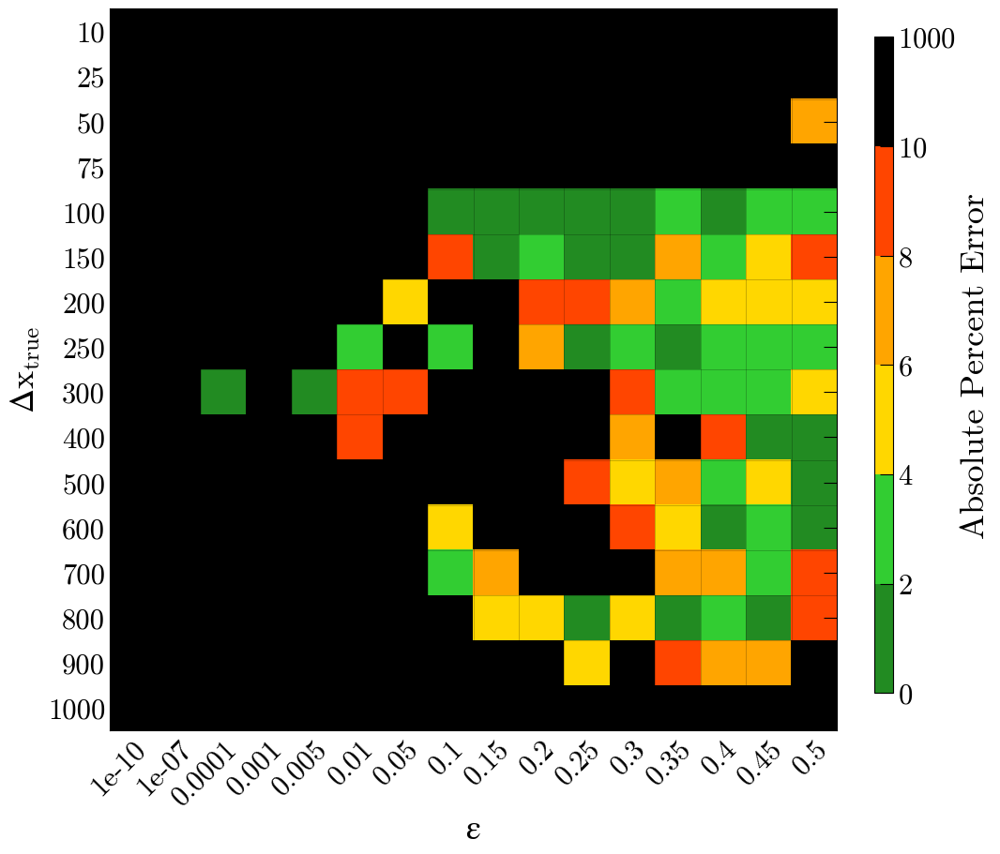

Number of squares with abs percent err>10%,  176


In [21]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 0s 3ms/step - loss: 98752.8359
Epoch 2/200
92/92 [==============================] - 0s 4ms/step - loss: 65724.0703
Epoch 3/200
92/92 [==============================] - 0s 4ms/step - loss: 65089.0391
Epoch 4/200
92/92 [==============================] - 0s 4ms/step - loss: 64373.1289
Epoch 5/200
92/92 [==============================] - 0s 4ms/step - loss: 63366.5508
Epoch 6/200
92/92 [==============================] - 0s 4ms/step - loss: 63049.0586
Epoch 7/200
92/92 [==============================] - 0s 4ms/step - loss: 61773.4023
Epoch 8/200
92/92 [==============================] - 0s 4ms/step - loss: 61930.3906
Epoch 9/200
92/92 [==============================] - 0s 4ms/step - loss: 61134.0117
Epoch 10/200
92/92 [==============================] - 0s 4ms/step - loss: 61265.2383
Epoch 11/200
92/92 [==============================] - 0s 4ms/step - loss: 60417.9727
Epoch 12/200
92/92 [==============================] - 0s 4ms/step - loss: 

92/92 [==============================] - 0s 3ms/step - loss: 54915.2578
Epoch 193/200
92/92 [==============================] - 0s 3ms/step - loss: 54764.5859
Epoch 194/200
92/92 [==============================] - 0s 3ms/step - loss: 54874.2031
Epoch 195/200
92/92 [==============================] - 0s 3ms/step - loss: 54658.7227
Epoch 196/200
92/92 [==============================] - 0s 3ms/step - loss: 54760.4141
Epoch 197/200
92/92 [==============================] - 0s 4ms/step - loss: 54947.5508
Epoch 198/200
92/92 [==============================] - 0s 3ms/step - loss: 54457.8555
Epoch 199/200
92/92 [==============================] - 0s 3ms/step - loss: 54765.3672
Epoch 200/200
92/92 [==============================] - 0s 3ms/step - loss: 54880.0781

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 235.003 pc
MAE: 147.338 pc
BIAS: 5.733 pc
MED FRAC ERR: 0.508 

Training Stats, Successful Fits
Frac Success Fit: 0.115 
RMSE: 20.586 pc
MAE: 14.076 pc
BIAS: 7.093 pc
MED FRAC ERR: 0.058 

Testing Stats
RMSE: 238.405 pc
MAE: 90.036 pc
BIAS: 23.777 pc
MED FRAC ERR: 0.210 

Testing Stats, Successful Fits
Frac Success Fit: 0.219 
RMSE: 26.722 pc
MAE: 15.630 pc
BIAS: 9.239 pc
MED FRAC ERR: 0.074 


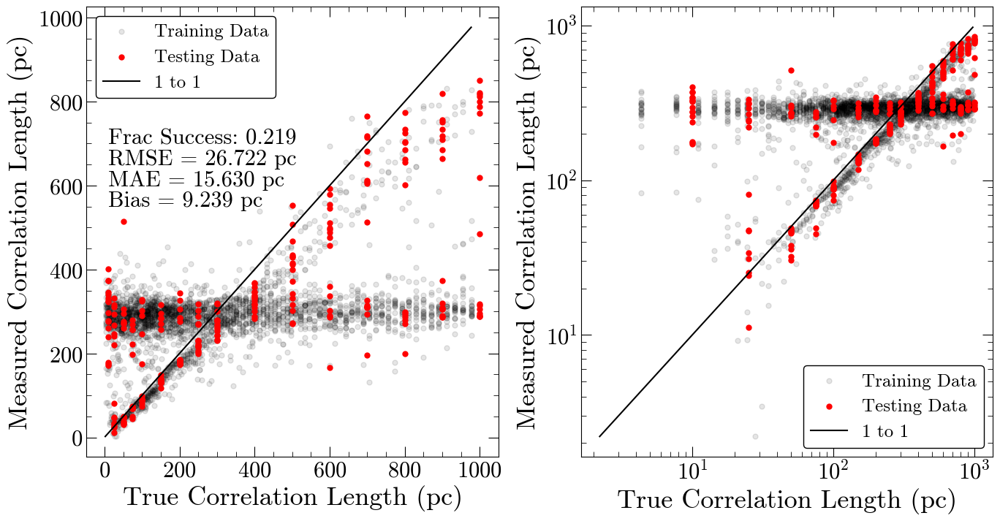

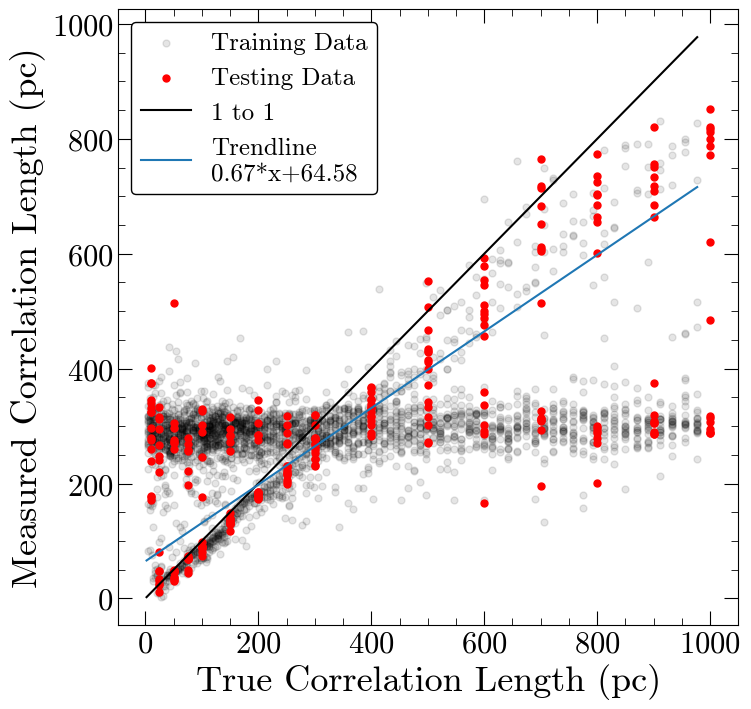

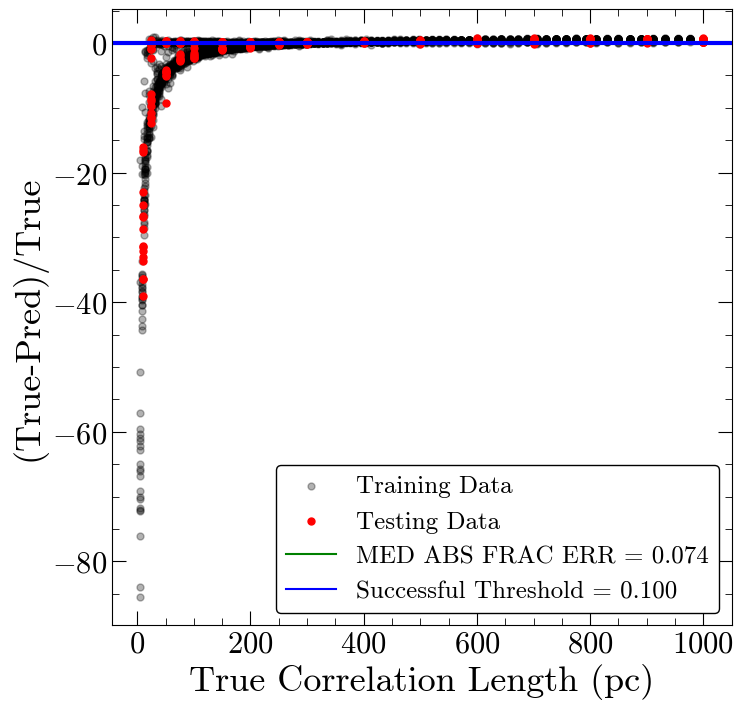

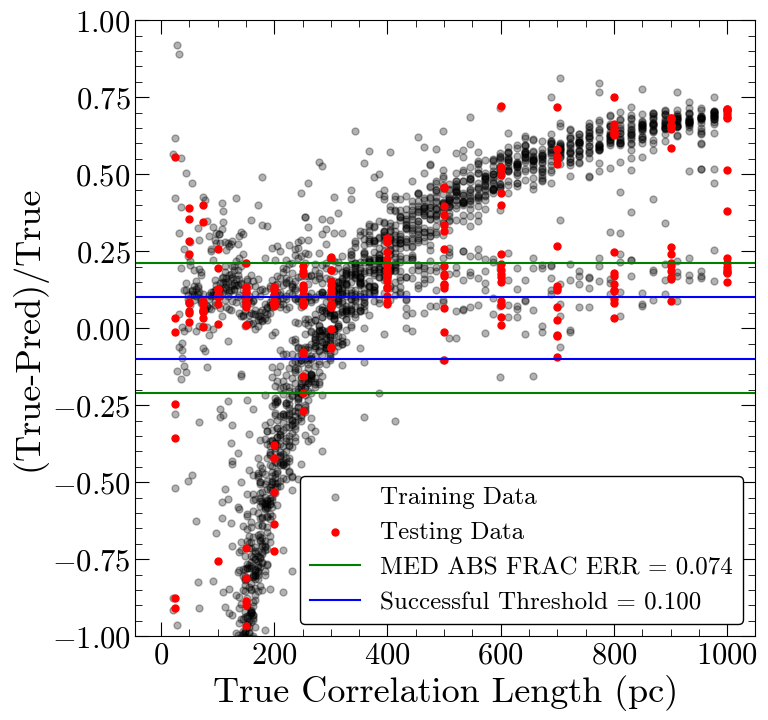

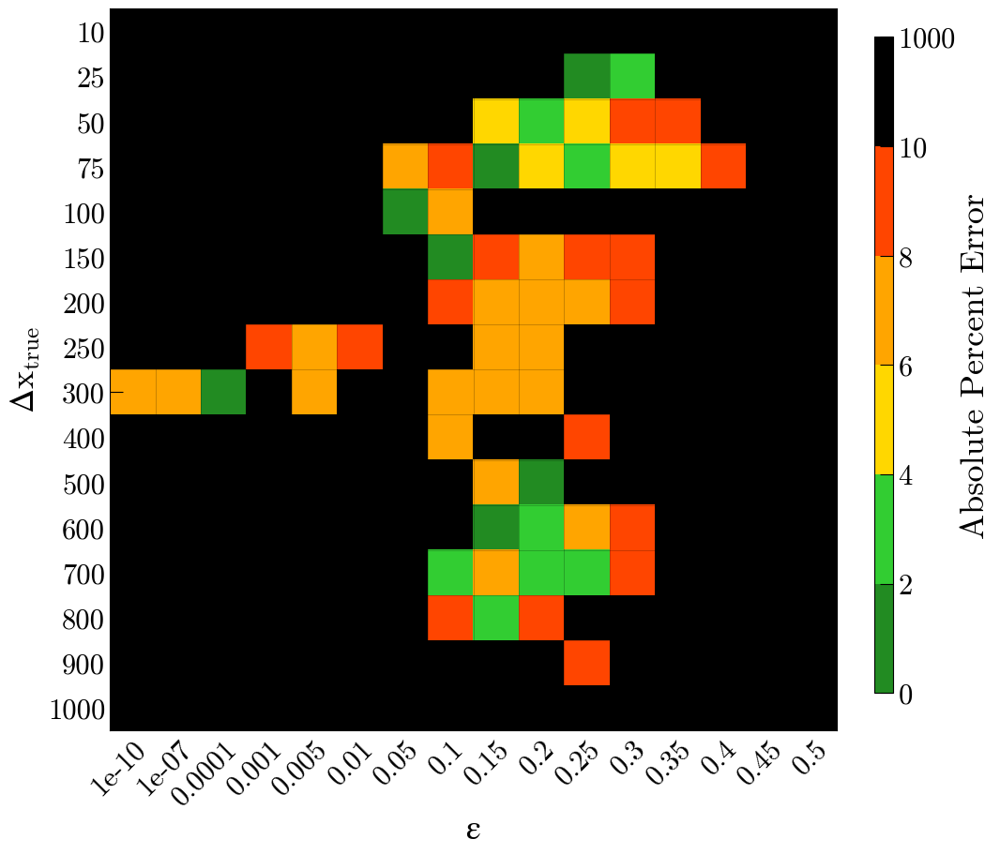

Number of squares with abs percent err>10%,  200


In [22]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 0s 2ms/step - loss: 105777.3672
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 65555.8281
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 65487.9414
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 64950.4453
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 64875.8320
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 64672.9648
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 64622.6289
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 64450.4961
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 64447.6758
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 64182.5273
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 63680.0430
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 239.067 pc
MAE: 143.279 pc
BIAS: 8.685 pc
MED FRAC ERR: 0.528 

Training Stats, Successful Fits
Frac Success Fit: 0.098 
RMSE: 20.693 pc
MAE: 13.549 pc
BIAS: 5.325 pc
MED FRAC ERR: 0.052 

Testing Stats
RMSE: 241.893 pc
MAE: 77.663 pc
BIAS: 27.913 pc
MED FRAC ERR: 0.227 

Testing Stats, Successful Fits
Frac Success Fit: 0.199 
RMSE: 28.938 pc
MAE: 18.945 pc
BIAS: 10.560 pc
MED FRAC ERR: 0.059 


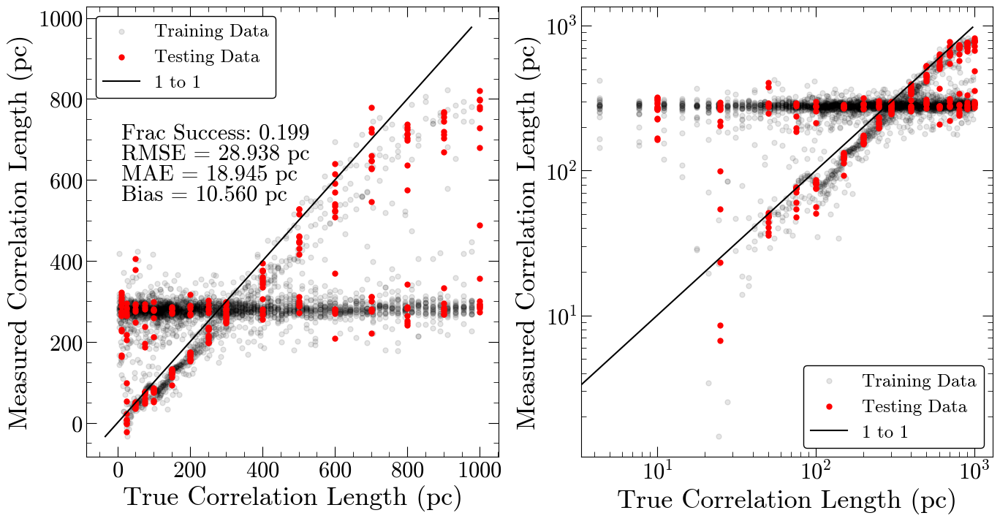

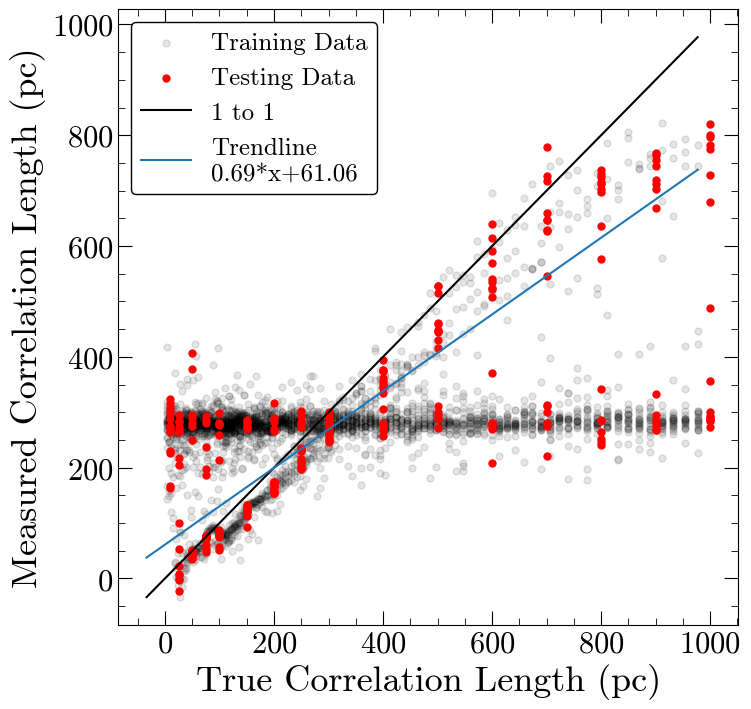

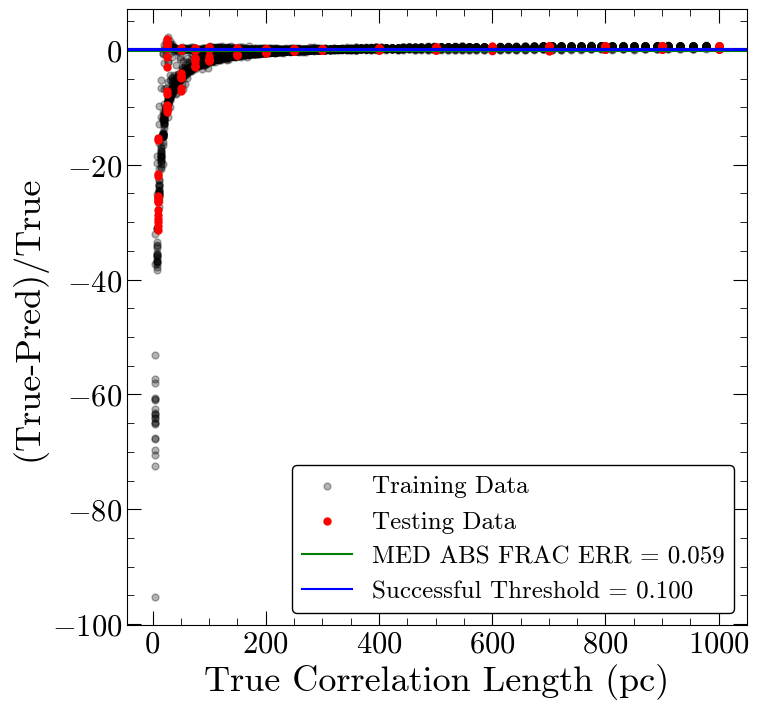

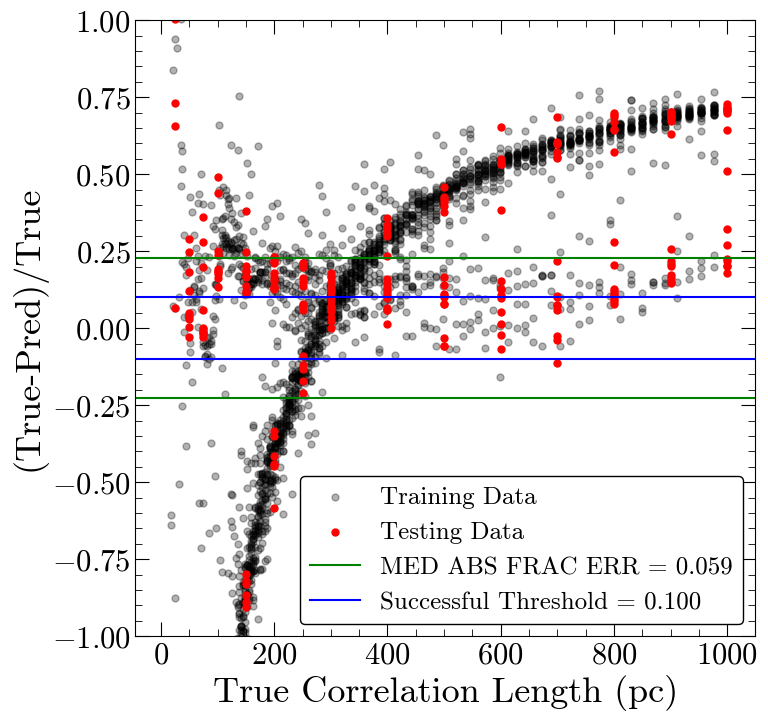

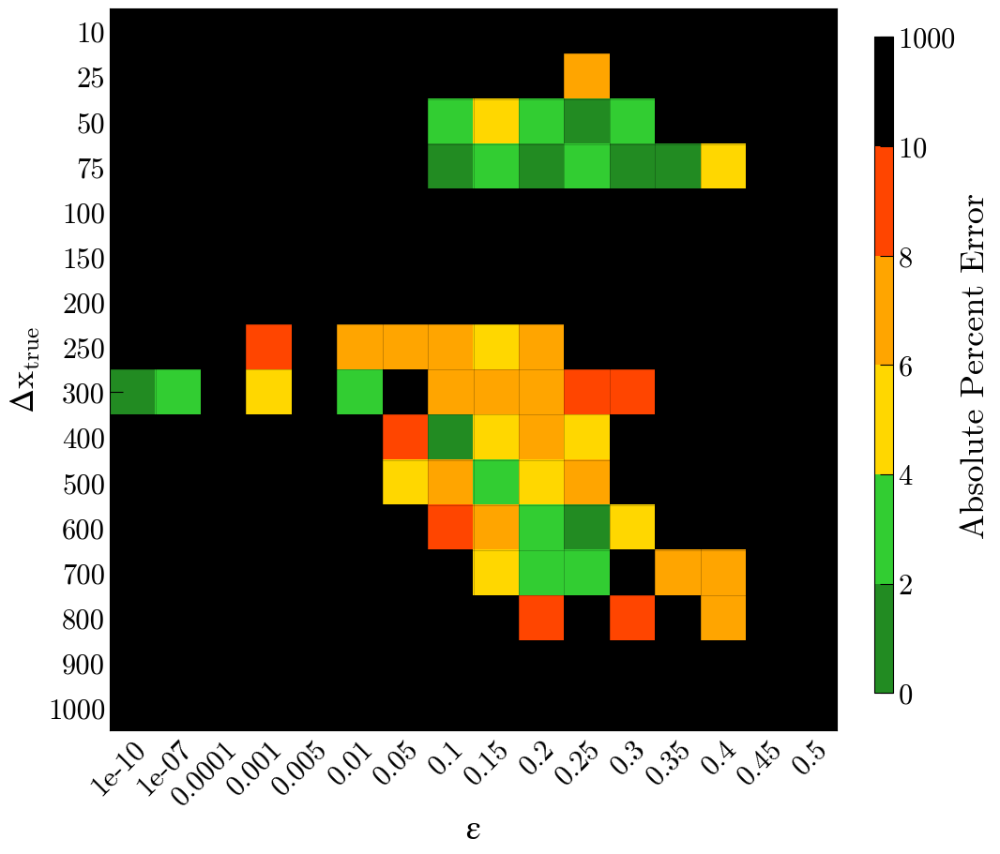

Number of squares with abs percent err>10%,  205


In [23]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 0s 3ms/step - loss: 105136.5781
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 65321.2070
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 65126.3008
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 63944.4844
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 62431.7305
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 61297.0469
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 61273.5273
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 60195.8906
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 59822.0078
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 59533.4023
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 58894.2344
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 235.039 pc
MAE: 158.771 pc
BIAS: -10.846 pc
MED FRAC ERR: 0.513 

Training Stats, Successful Fits
Frac Success Fit: 0.181 
RMSE: 20.852 pc
MAE: 9.467 pc
BIAS: 3.728 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 227.617 pc
MAE: 76.688 pc
BIAS: 5.385 pc
MED FRAC ERR: 0.158 

Testing Stats, Successful Fits
Frac Success Fit: 0.383 
RMSE: 24.090 pc
MAE: 7.858 pc
BIAS: 5.256 pc
MED FRAC ERR: 0.042 


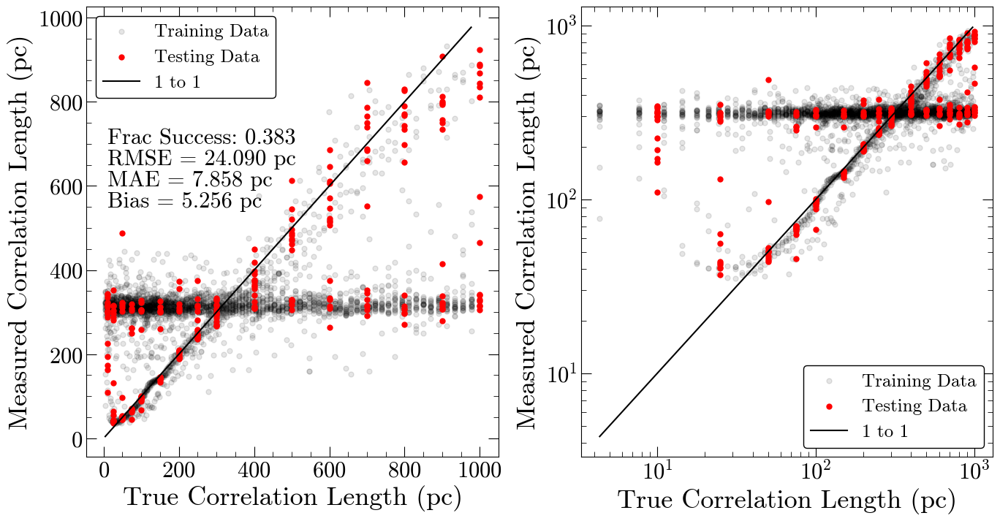

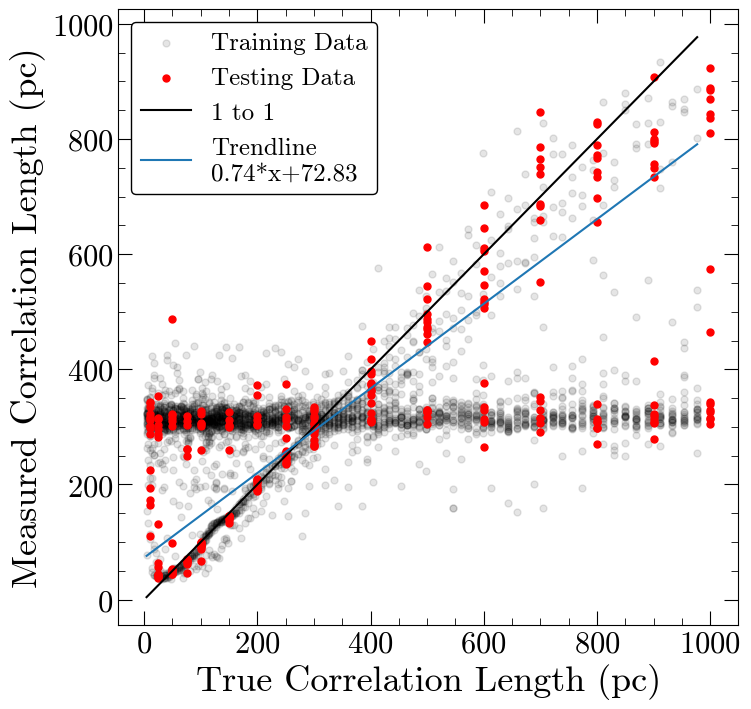

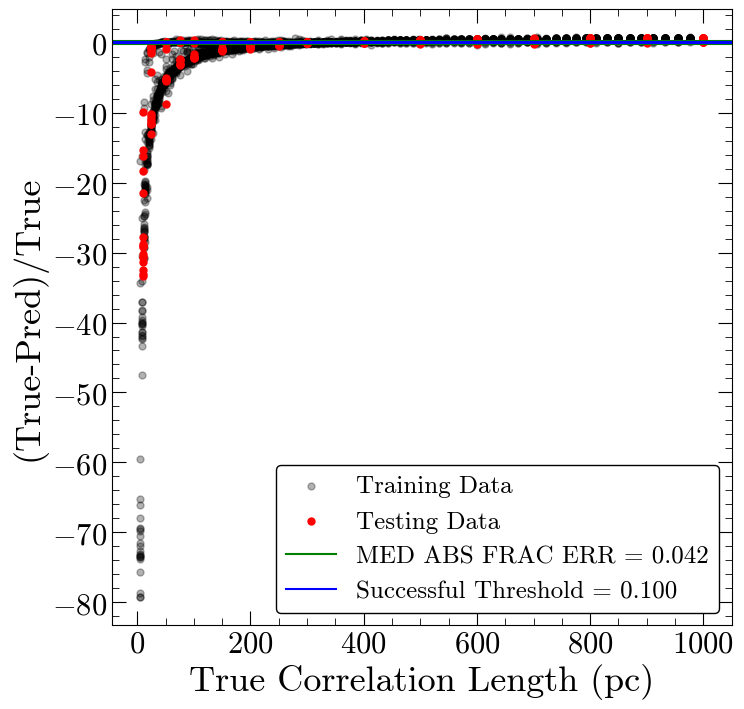

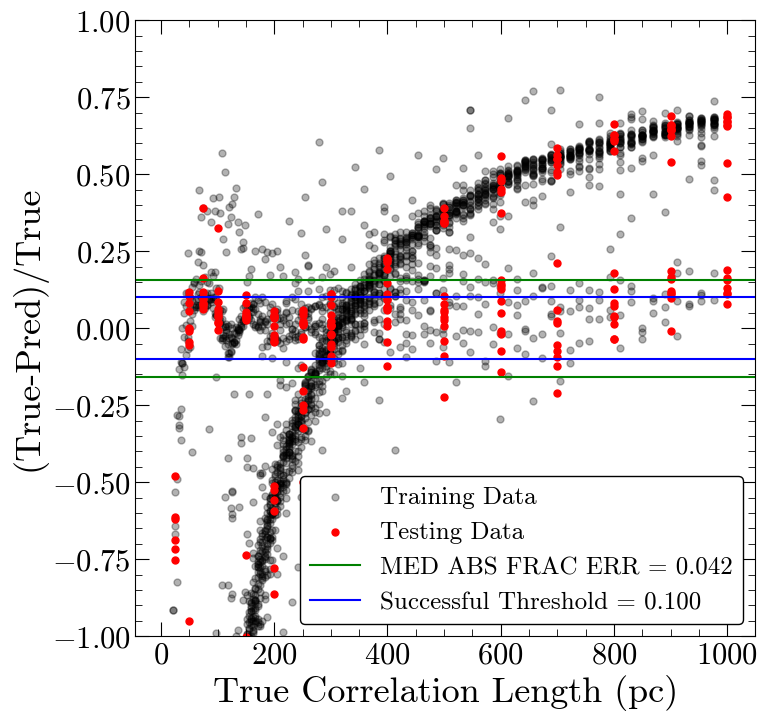

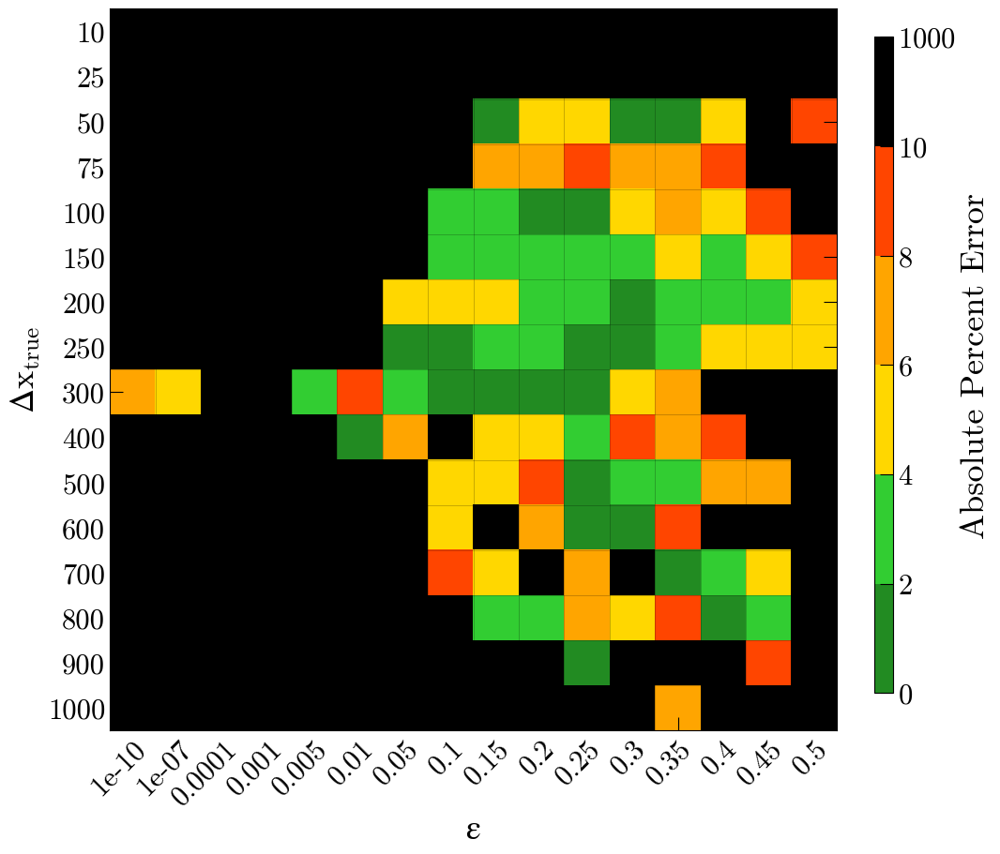

Number of squares with abs percent err>10%,  158


In [24]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 0s 2ms/step - loss: 101274.7500
Epoch 2/200
92/92 [==============================] - 0s 3ms/step - loss: 65475.0391
Epoch 3/200
92/92 [==============================] - 0s 3ms/step - loss: 65284.9453
Epoch 4/200
92/92 [==============================] - 0s 3ms/step - loss: 65107.1055
Epoch 5/200
92/92 [==============================] - 0s 3ms/step - loss: 65055.5000
Epoch 6/200
92/92 [==============================] - 0s 3ms/step - loss: 65193.1680
Epoch 7/200
92/92 [==============================] - 0s 3ms/step - loss: 64561.1211
Epoch 8/200
92/92 [==============================] - 0s 3ms/step - loss: 64137.8477
Epoch 9/200
92/92 [==============================] - 0s 3ms/step - loss: 64475.2891
Epoch 10/200
92/92 [==============================] - 0s 3ms/step - loss: 63624.6367
Epoch 11/200
92/92 [==============================] - 0s 3ms/step - loss: 63348.9023
Epoch 12/200
92/92 [==============================] - 0s 3ms/step - loss:

92/92 [==============================] - 0s 3ms/step - loss: 54665.3047
Epoch 193/200
92/92 [==============================] - 0s 3ms/step - loss: 54740.3047
Epoch 194/200
92/92 [==============================] - 0s 3ms/step - loss: 54508.0078
Epoch 195/200
92/92 [==============================] - 0s 3ms/step - loss: 54528.2188
Epoch 196/200
92/92 [==============================] - 0s 3ms/step - loss: 54642.1680
Epoch 197/200
92/92 [==============================] - 0s 3ms/step - loss: 54356.0586
Epoch 198/200
92/92 [==============================] - 0s 3ms/step - loss: 54336.2070
Epoch 199/200
92/92 [==============================] - 0s 3ms/step - loss: 54739.8359
Epoch 200/200
92/92 [==============================] - 0s 3ms/step - loss: 54372.4492

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 232.289 pc
MAE: 156.739 pc
BIAS: -11.314 pc
MED FRAC ERR: 0.511 

Training Stats, Successful Fits
Frac Success Fit: 0.147 
RMSE: 19.626 pc
MAE: 11.498 pc
BIAS: 5.326 pc
MED FRAC ERR: 0.049 

Testing Stats
RMSE: 228.366 pc
MAE: 70.161 pc
BIAS: 15.669 pc
MED FRAC ERR: 0.179 

Testing Stats, Successful Fits
Frac Success Fit: 0.297 
RMSE: 28.075 pc
MAE: 16.563 pc
BIAS: 13.001 pc
MED FRAC ERR: 0.057 


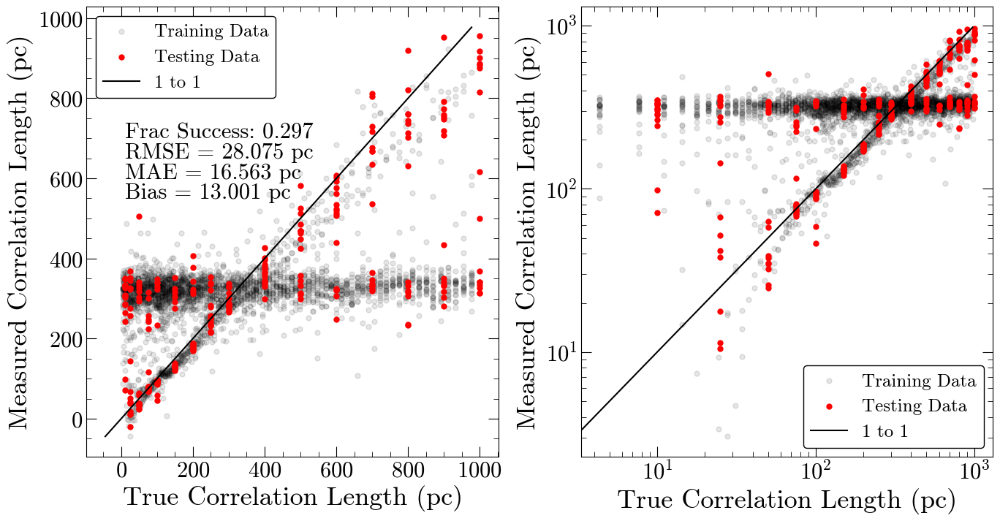

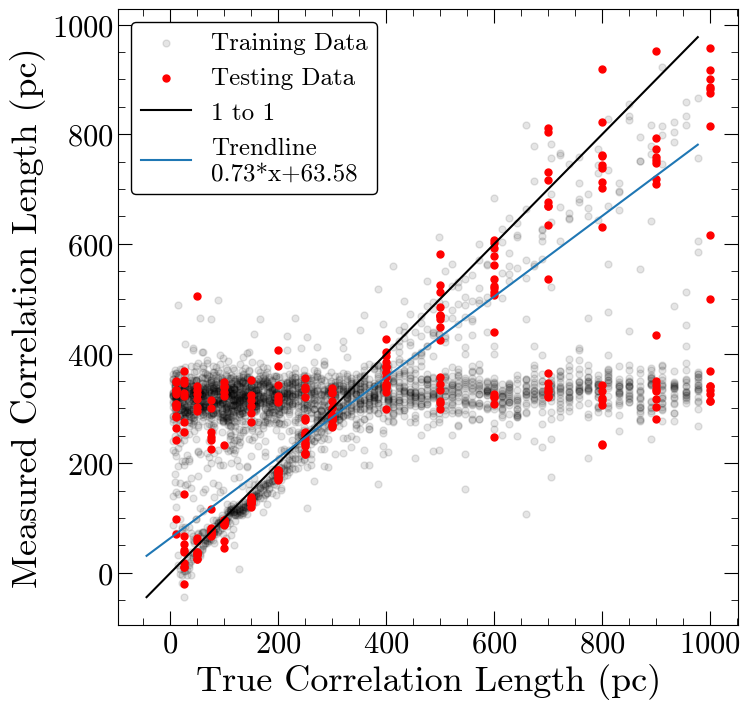

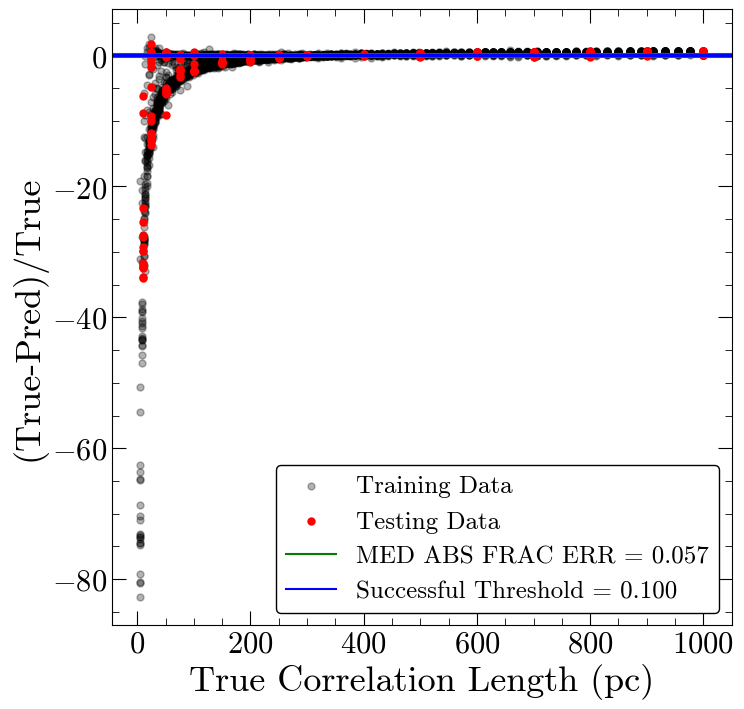

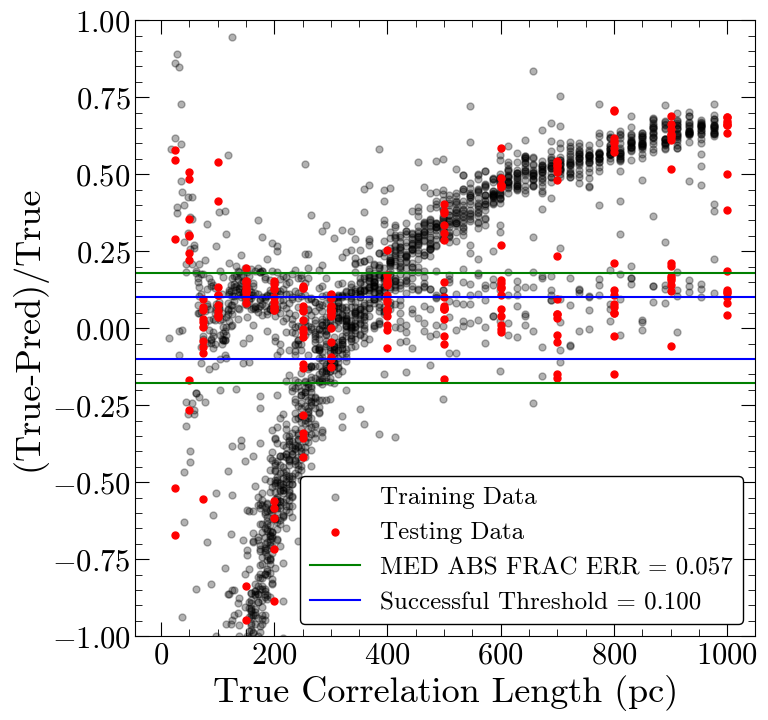

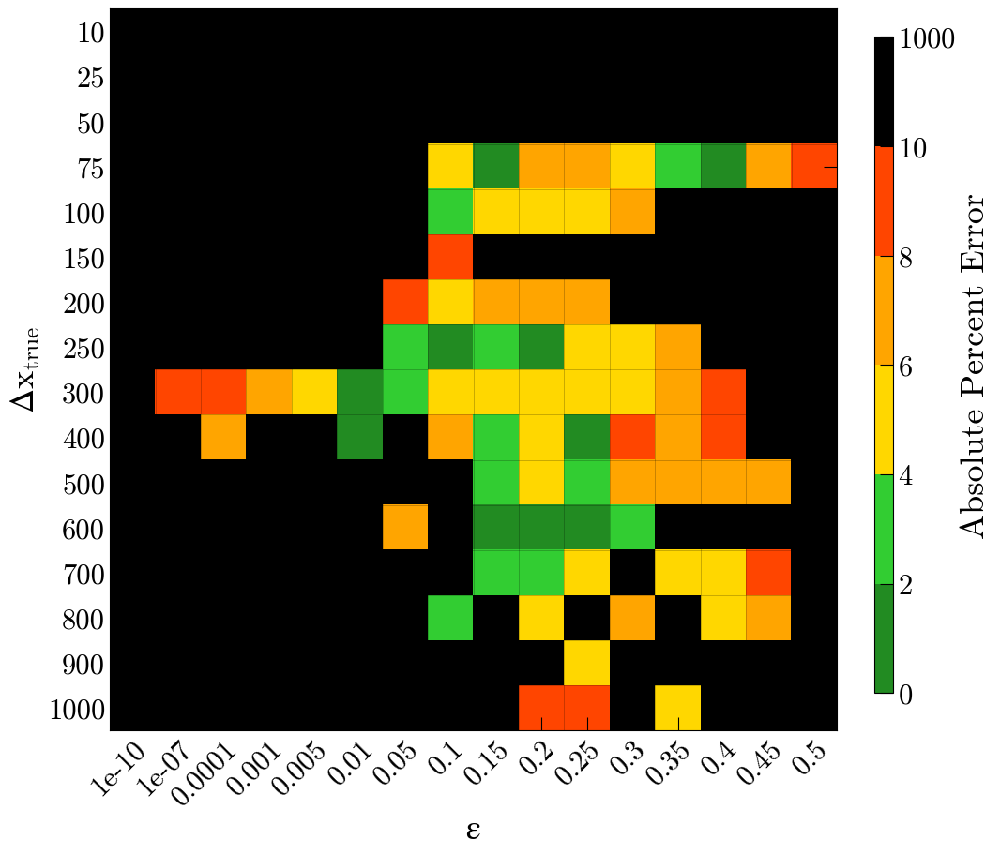

Number of squares with abs percent err>10%,  180


In [25]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 0s 3ms/step - loss: 98902.1719
Epoch 2/400
92/92 [==============================] - 0s 3ms/step - loss: 65538.9766
Epoch 3/400
92/92 [==============================] - 0s 3ms/step - loss: 65195.9844
Epoch 4/400
92/92 [==============================] - 0s 3ms/step - loss: 64140.1289
Epoch 5/400
92/92 [==============================] - 0s 3ms/step - loss: 63059.9648
Epoch 6/400
92/92 [==============================] - 0s 3ms/step - loss: 62373.5391
Epoch 7/400
92/92 [==============================] - 0s 3ms/step - loss: 61759.9766
Epoch 8/400
92/92 [==============================] - 0s 3ms/step - loss: 60881.7812
Epoch 9/400
92/92 [==============================] - 0s 3ms/step - loss: 60863.4180
Epoch 10/400
92/92 [==============================] - 0s 3ms/step - loss: 60426.3867
Epoch 11/400
92/92 [==============================] - 0s 3ms/step - loss: 60440.9609
Epoch 12/400
92/92 [==============================] - 0s 3ms/step - loss: 

92/92 [==============================] - 0s 3ms/step - loss: 54959.9570
Epoch 193/400
92/92 [==============================] - 0s 3ms/step - loss: 54906.3789
Epoch 194/400
92/92 [==============================] - 0s 4ms/step - loss: 54557.7539
Epoch 195/400
92/92 [==============================] - 0s 3ms/step - loss: 54988.6250
Epoch 196/400
92/92 [==============================] - 0s 3ms/step - loss: 54953.0781
Epoch 197/400
92/92 [==============================] - 0s 3ms/step - loss: 54700.4961
Epoch 198/400
92/92 [==============================] - 0s 3ms/step - loss: 54486.4648
Epoch 199/400
92/92 [==============================] - 0s 3ms/step - loss: 54818.2617
Epoch 200/400
92/92 [==============================] - 0s 3ms/step - loss: 54746.3945
Epoch 201/400
92/92 [==============================] - 0s 3ms/step - loss: 54802.7266
Epoch 202/400
92/92 [==============================] - 0s 3ms/step - loss: 54699.0859
Epoch 203/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 46722.3945
Epoch 383/400
92/92 [==============================] - 0s 4ms/step - loss: 46609.0625
Epoch 384/400
92/92 [==============================] - 0s 4ms/step - loss: 46932.1953
Epoch 385/400
92/92 [==============================] - 0s 4ms/step - loss: 47920.8867
Epoch 386/400
92/92 [==============================] - 0s 4ms/step - loss: 46130.3867
Epoch 387/400
92/92 [==============================] - 0s 4ms/step - loss: 46313.3945
Epoch 388/400
92/92 [==============================] - 0s 4ms/step - loss: 46199.4766
Epoch 389/400
92/92 [==============================] - 0s 4ms/step - loss: 46680.6914
Epoch 390/400
92/92 [==============================] - 0s 4ms/step - loss: 46432.6250
Epoch 391/400
92/92 [==============================] - 0s 4ms/step - loss: 45836.5234
Epoch 392/400
92/92 [==============================] - 0s 4ms/step - loss: 45750.1797
Epoch 393/400
92/92 [==============================] - 0s 4ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 211.410 pc
MAE: 120.246 pc
BIAS: -2.690 pc
MED FRAC ERR: 0.445 

Training Stats, Successful Fits
Frac Success Fit: 0.188 
RMSE: 18.486 pc
MAE: 8.621 pc
BIAS: 4.045 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 246.919 pc
MAE: 76.264 pc
BIAS: 7.913 pc
MED FRAC ERR: 0.204 

Testing Stats, Successful Fits
Frac Success Fit: 0.379 
RMSE: 23.737 pc
MAE: 9.841 pc
BIAS: 5.587 pc
MED FRAC ERR: 0.037 


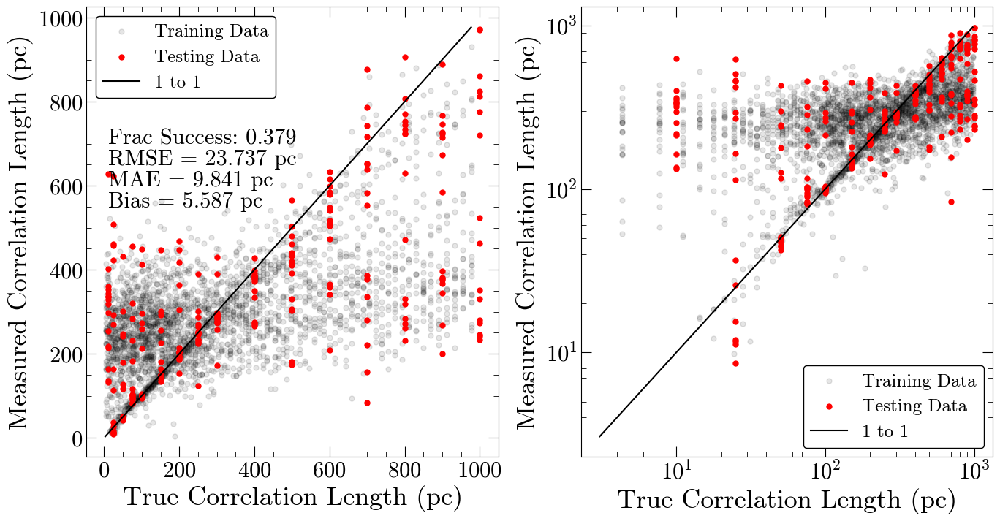

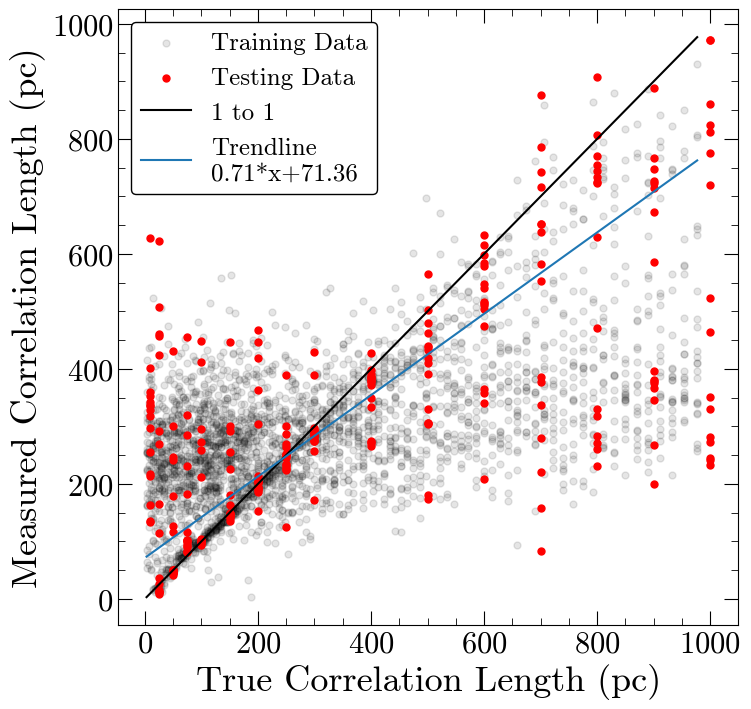

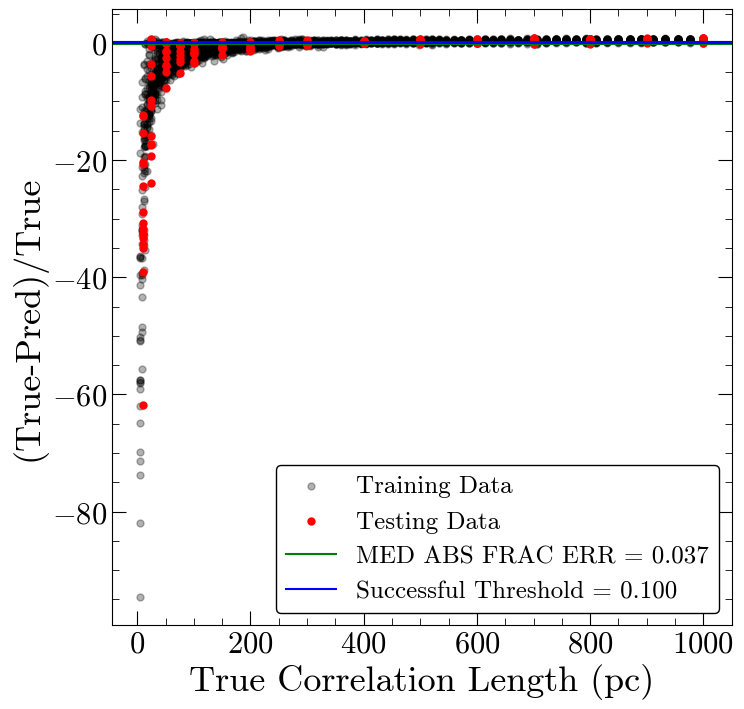

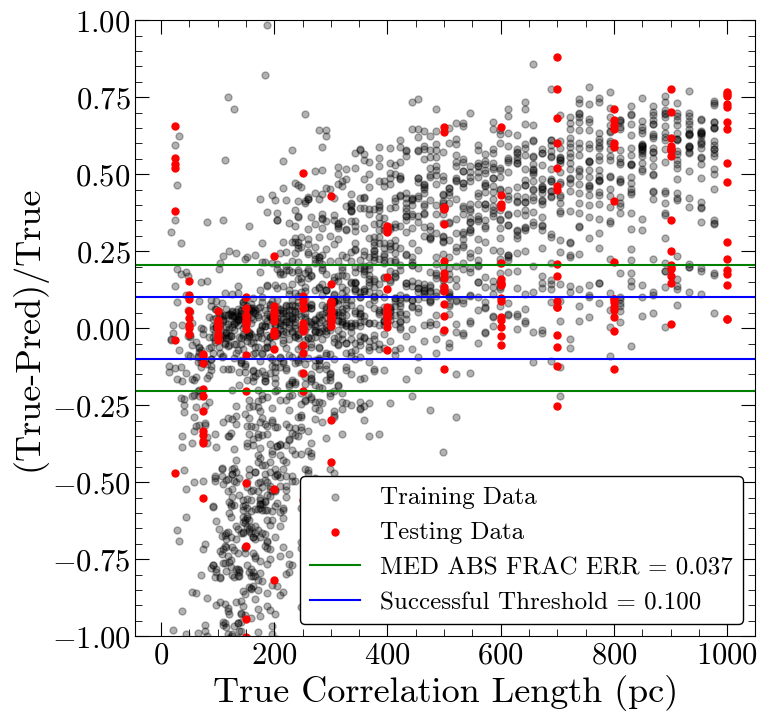

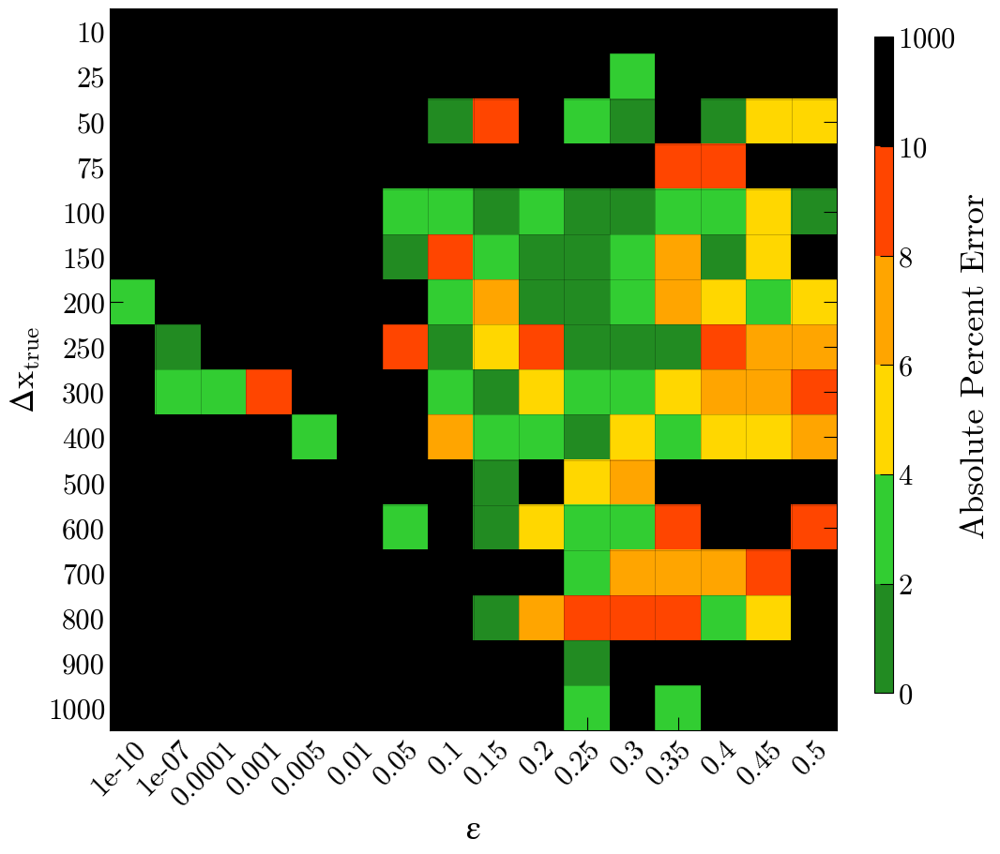

Number of squares with abs percent err>10%,  159


In [26]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 3ms/step - loss: 93014.8281
Epoch 2/400
92/92 [==============================] - 0s 4ms/step - loss: 65754.4062
Epoch 3/400
92/92 [==============================] - 0s 4ms/step - loss: 64916.6133
Epoch 4/400
92/92 [==============================] - 0s 4ms/step - loss: 64086.3750
Epoch 5/400
92/92 [==============================] - 0s 4ms/step - loss: 62689.5938
Epoch 6/400
92/92 [==============================] - 0s 4ms/step - loss: 61926.8086
Epoch 7/400
92/92 [==============================] - 0s 4ms/step - loss: 60824.2422
Epoch 8/400
92/92 [==============================] - 0s 4ms/step - loss: 60856.6211
Epoch 9/400
92/92 [==============================] - 0s 4ms/step - loss: 59785.3828
Epoch 10/400
92/92 [==============================] - 0s 4ms/step - loss: 60356.2500
Epoch 11/400
92/92 [==============================] - 0s 4ms/step - loss: 59952.0547
Epoch 12/400
92/92 [==============================] - 0s 4ms/step - loss: 

92/92 [==============================] - 0s 4ms/step - loss: 50270.0430
Epoch 193/400
92/92 [==============================] - 0s 4ms/step - loss: 50528.4766
Epoch 194/400
92/92 [==============================] - 0s 4ms/step - loss: 50251.4648
Epoch 195/400
92/92 [==============================] - 0s 4ms/step - loss: 50352.0859
Epoch 196/400
92/92 [==============================] - 0s 4ms/step - loss: 50074.0117
Epoch 197/400
92/92 [==============================] - 0s 4ms/step - loss: 49733.2695
Epoch 198/400
92/92 [==============================] - 0s 4ms/step - loss: 49737.1641
Epoch 199/400
92/92 [==============================] - 0s 4ms/step - loss: 49920.8477
Epoch 200/400
92/92 [==============================] - 0s 4ms/step - loss: 50273.0039
Epoch 201/400
92/92 [==============================] - 0s 4ms/step - loss: 50522.3242
Epoch 202/400
92/92 [==============================] - 0s 4ms/step - loss: 49566.0977
Epoch 203/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 11791.3564
Epoch 383/400
92/92 [==============================] - 0s 4ms/step - loss: 10241.3623
Epoch 384/400
92/92 [==============================] - 0s 4ms/step - loss: 11807.5400
Epoch 385/400
92/92 [==============================] - 0s 4ms/step - loss: 11012.0928
Epoch 386/400
92/92 [==============================] - 0s 4ms/step - loss: 10214.9033
Epoch 387/400
92/92 [==============================] - 0s 4ms/step - loss: 11113.7461
Epoch 388/400
92/92 [==============================] - 0s 4ms/step - loss: 10377.7764
Epoch 389/400
92/92 [==============================] - 0s 4ms/step - loss: 13386.3008
Epoch 390/400
92/92 [==============================] - 0s 4ms/step - loss: 10486.8477
Epoch 391/400
92/92 [==============================] - 0s 4ms/step - loss: 9241.8496
Epoch 392/400
92/92 [==============================] - 0s 4ms/step - loss: 9676.3516
Epoch 393/400
92/92 [==============================] - 0s 4ms/step - l

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 93.304 pc
MAE: 45.061 pc
BIAS: 9.630 pc
MED FRAC ERR: 0.188 

Training Stats, Successful Fits
Frac Success Fit: 0.335 
RMSE: 25.699 pc
MAE: 9.904 pc
BIAS: 2.432 pc
MED FRAC ERR: 0.040 

Testing Stats
RMSE: 268.379 pc
MAE: 43.285 pc
BIAS: 1.958 pc
MED FRAC ERR: 0.120 

Testing Stats, Successful Fits
Frac Success Fit: 0.469 
RMSE: 25.269 pc
MAE: 9.418 pc
BIAS: 1.958 pc
MED FRAC ERR: 0.040 


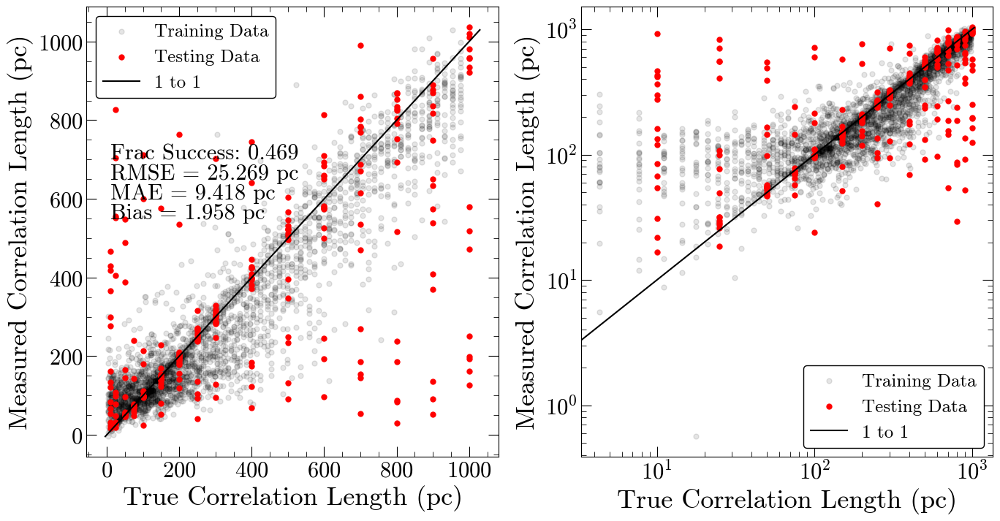

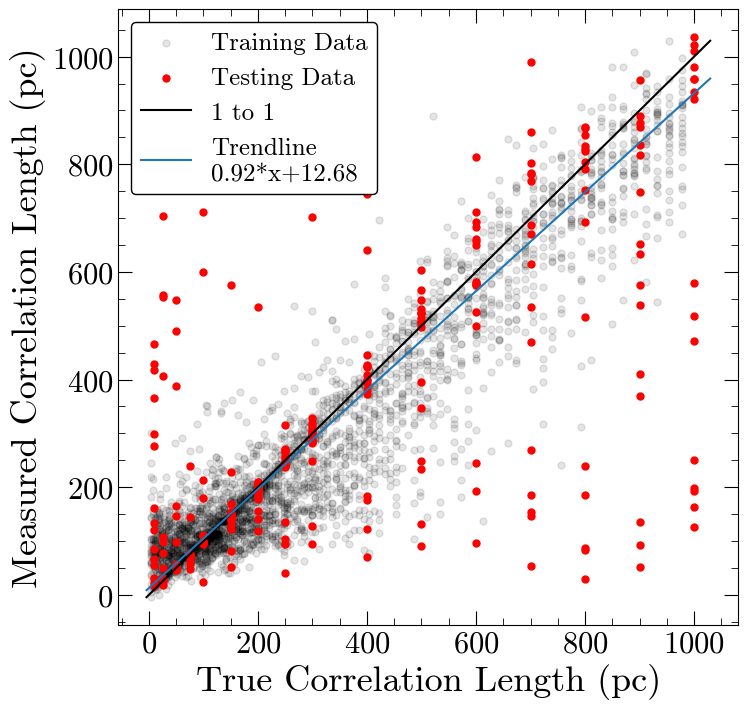

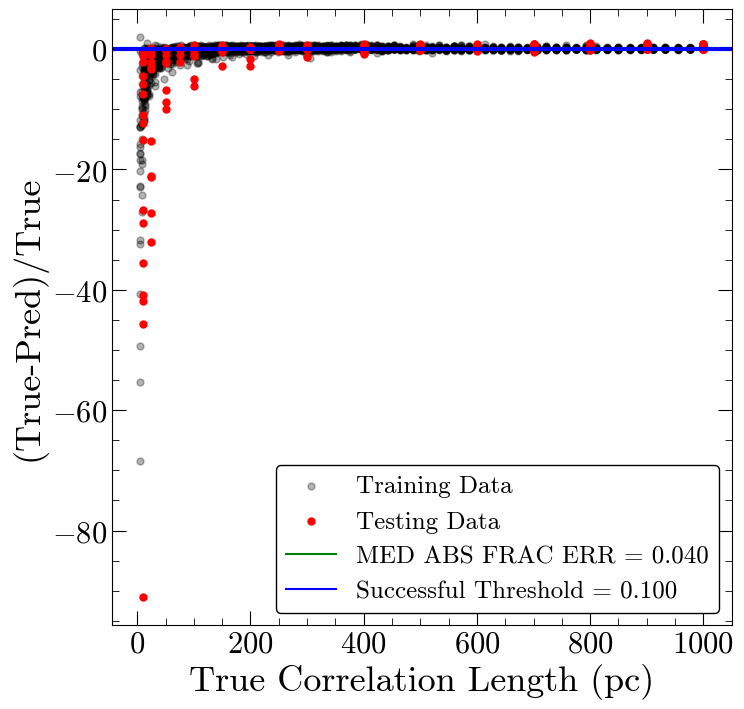

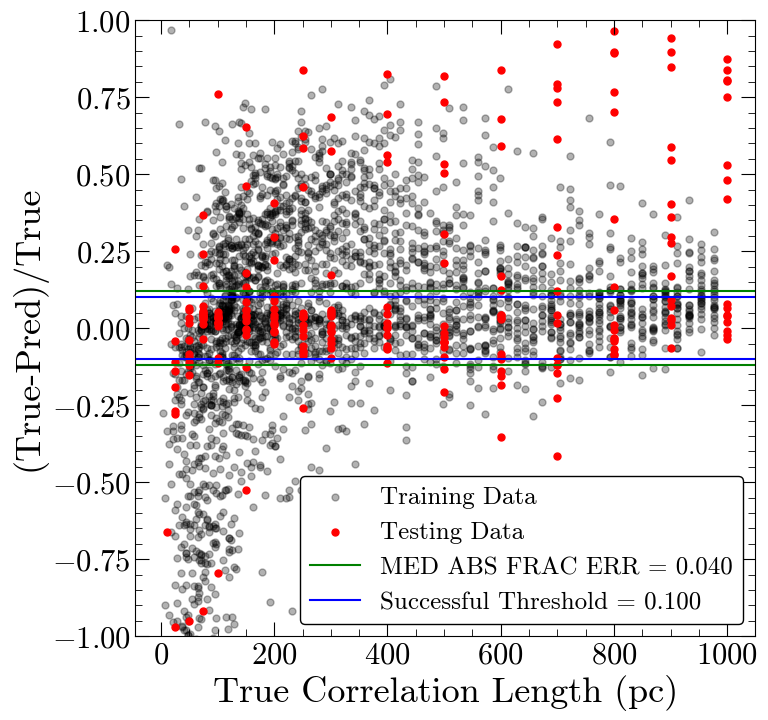

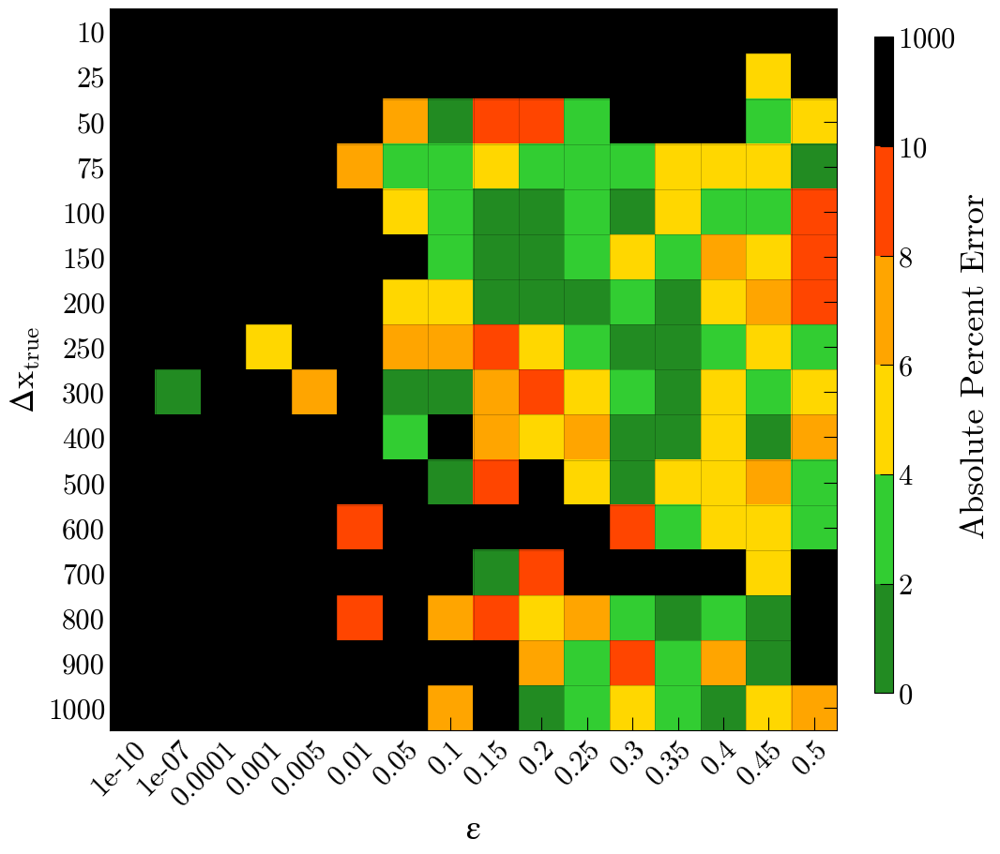

Number of squares with abs percent err>10%,  136


In [27]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 0s 4ms/step - loss: 123336.3281
Epoch 2/400
46/46 [==============================] - 0s 4ms/step - loss: 66726.1953
Epoch 3/400
46/46 [==============================] - 0s 5ms/step - loss: 65530.1211
Epoch 4/400
46/46 [==============================] - 0s 5ms/step - loss: 64534.3086
Epoch 5/400
46/46 [==============================] - 0s 5ms/step - loss: 64013.8203
Epoch 6/400
46/46 [==============================] - 0s 4ms/step - loss: 63312.8555
Epoch 7/400
46/46 [==============================] - 0s 5ms/step - loss: 62403.6211
Epoch 8/400
46/46 [==============================] - 0s 5ms/step - loss: 61782.9180
Epoch 9/400
46/46 [==============================] - 0s 5ms/step - loss: 61520.6523
Epoch 10/400
46/46 [==============================] - 0s 4ms/step - loss: 60808.7148
Epoch 11/400
46/46 [==============================] - 0s 5ms/step - loss: 60975.6172
Epoch 12/400
46/46 [==============================] - 0s 4ms/step - loss:

46/46 [==============================] - 0s 5ms/step - loss: 54449.8086
Epoch 193/400
46/46 [==============================] - 0s 5ms/step - loss: 54257.2617
Epoch 194/400
46/46 [==============================] - 0s 5ms/step - loss: 54835.2266
Epoch 195/400
46/46 [==============================] - 0s 5ms/step - loss: 54674.5039
Epoch 196/400
46/46 [==============================] - 0s 5ms/step - loss: 54341.1602
Epoch 197/400
46/46 [==============================] - 0s 5ms/step - loss: 54603.2109
Epoch 198/400
46/46 [==============================] - 0s 5ms/step - loss: 54694.7383
Epoch 199/400
46/46 [==============================] - 0s 5ms/step - loss: 54172.9492
Epoch 200/400
46/46 [==============================] - 0s 5ms/step - loss: 54562.9375
Epoch 201/400
46/46 [==============================] - 0s 5ms/step - loss: 54493.1836
Epoch 202/400
46/46 [==============================] - 0s 5ms/step - loss: 54154.0664
Epoch 203/400
46/46 [==============================] - 0s 5ms/step -

46/46 [==============================] - 0s 5ms/step - loss: 36029.1719
Epoch 383/400
46/46 [==============================] - 0s 5ms/step - loss: 35705.6133
Epoch 384/400
46/46 [==============================] - 0s 4ms/step - loss: 35934.0508
Epoch 385/400
46/46 [==============================] - 0s 5ms/step - loss: 36553.9688
Epoch 386/400
46/46 [==============================] - 0s 5ms/step - loss: 38582.3203
Epoch 387/400
46/46 [==============================] - 0s 5ms/step - loss: 35045.0039
Epoch 388/400
46/46 [==============================] - 0s 5ms/step - loss: 35523.6719
Epoch 389/400
46/46 [==============================] - 0s 5ms/step - loss: 34915.8164
Epoch 390/400
46/46 [==============================] - 0s 4ms/step - loss: 37568.6680
Epoch 391/400
46/46 [==============================] - 0s 5ms/step - loss: 33944.8086
Epoch 392/400
46/46 [==============================] - 0s 4ms/step - loss: 34194.3164
Epoch 393/400
46/46 [==============================] - 0s 5ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 174.855 pc
MAE: 93.180 pc
BIAS: -3.367 pc
MED FRAC ERR: 0.336 

Training Stats, Successful Fits
Frac Success Fit: 0.252 
RMSE: 23.216 pc
MAE: 9.394 pc
BIAS: 1.969 pc
MED FRAC ERR: 0.041 

Testing Stats
RMSE: 258.970 pc
MAE: 56.421 pc
BIAS: 1.842 pc
MED FRAC ERR: 0.147 

Testing Stats, Successful Fits
Frac Success Fit: 0.426 
RMSE: 21.823 pc
MAE: 8.091 pc
BIAS: 1.921 pc
MED FRAC ERR: 0.038 


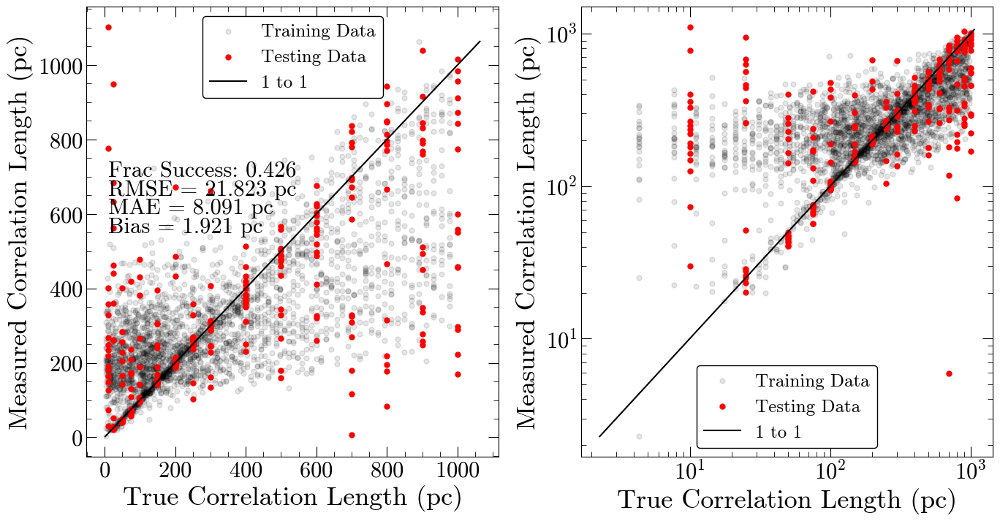

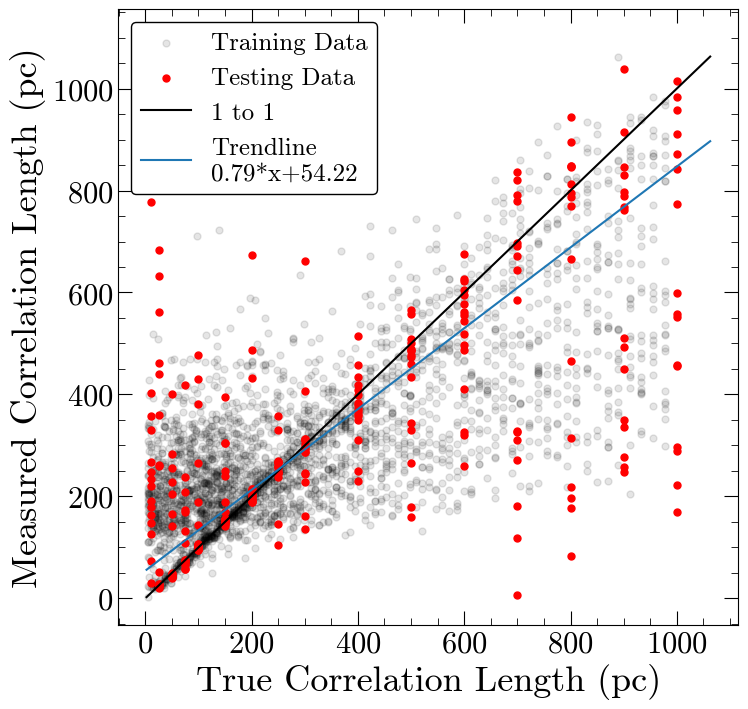

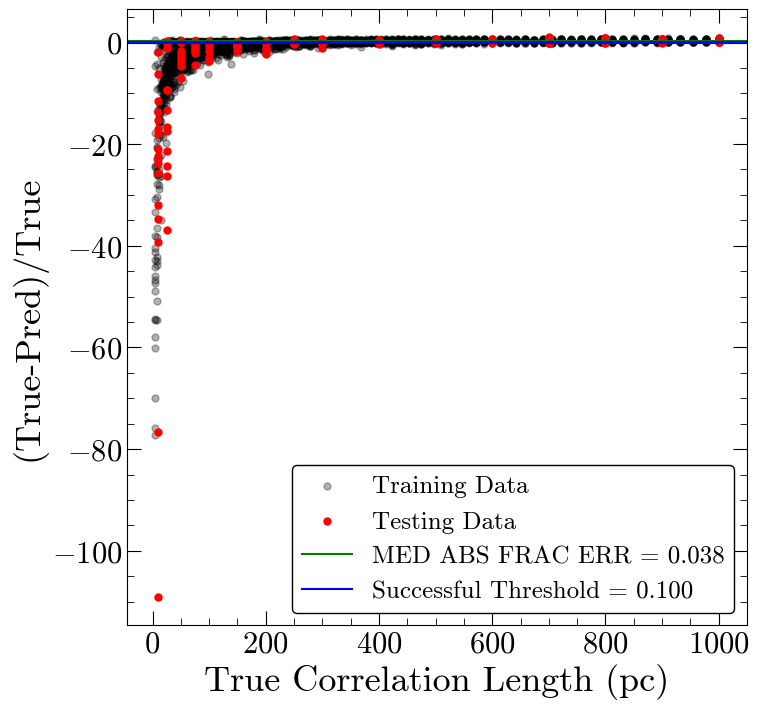

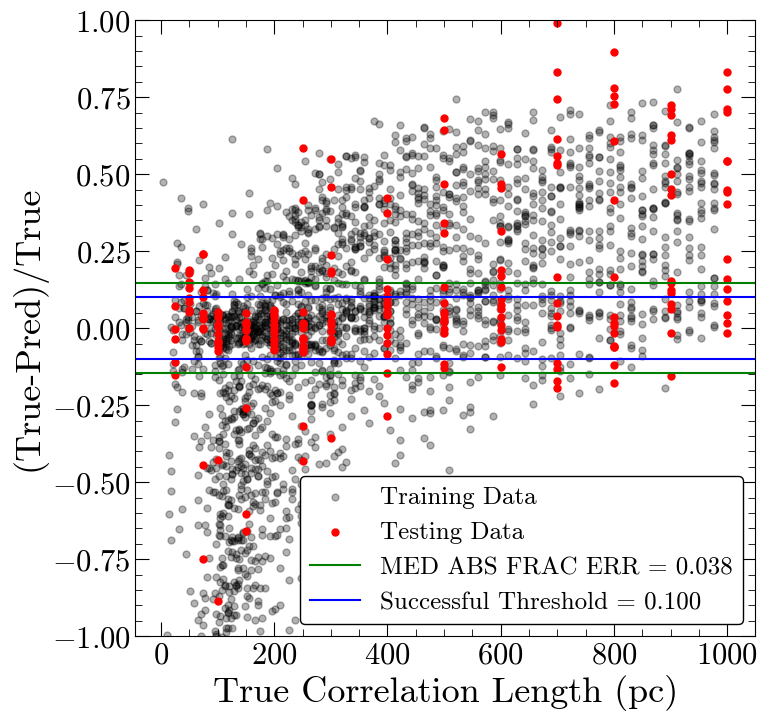

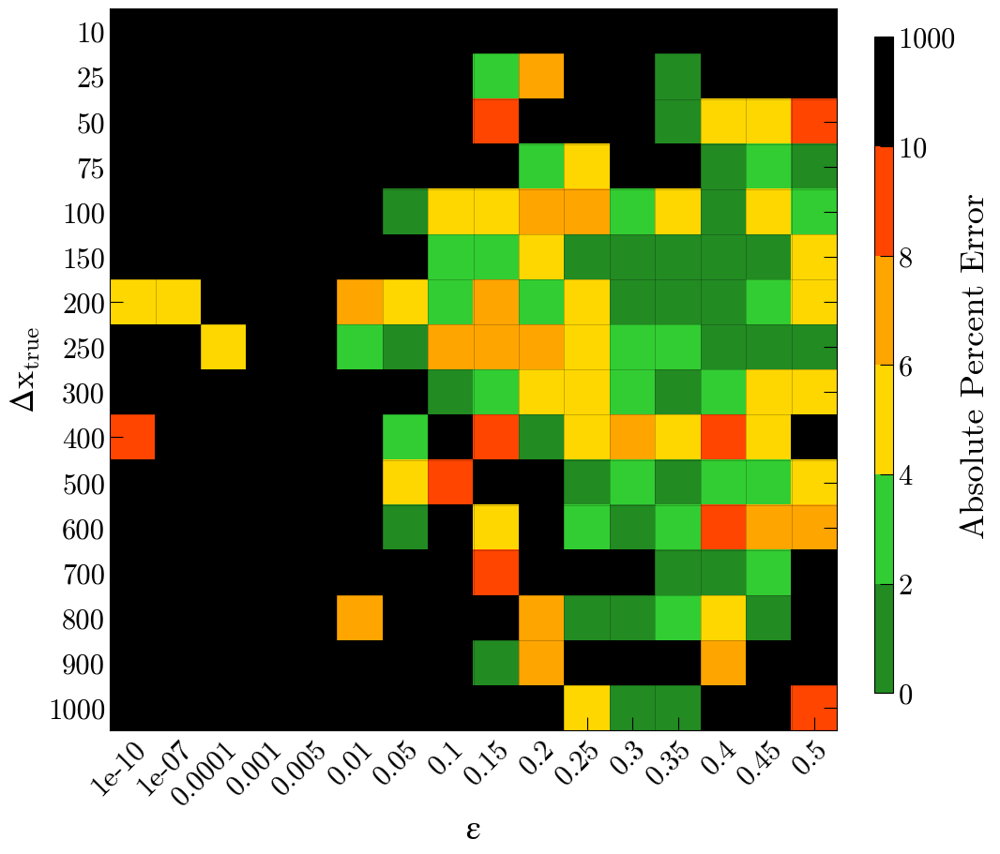

Number of squares with abs percent err>10%,  147


In [28]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 0s 9ms/step - loss: 164164.2656
Epoch 2/400
10/10 [==============================] - 0s 9ms/step - loss: 161044.7344
Epoch 3/400
10/10 [==============================] - 0s 10ms/step - loss: 136935.6250
Epoch 4/400
10/10 [==============================] - 0s 12ms/step - loss: 78397.8438
Epoch 5/400
10/10 [==============================] - 0s 10ms/step - loss: 69337.2500
Epoch 6/400
10/10 [==============================] - 0s 10ms/step - loss: 67498.5469
Epoch 7/400
10/10 [==============================] - 0s 11ms/step - loss: 66382.1406
Epoch 8/400
10/10 [==============================] - 0s 10ms/step - loss: 66000.3438
Epoch 9/400
10/10 [==============================] - 0s 9ms/step - loss: 65700.9062
Epoch 10/400
10/10 [==============================] - 0s 11ms/step - loss: 65506.2695
Epoch 11/400
10/10 [==============================] - 0s 10ms/step - loss: 65479.6484
Epoch 12/400
10/10 [==============================] - 0s 10ms/s

10/10 [==============================] - 0s 12ms/step - loss: 56752.1875
Epoch 191/400
10/10 [==============================] - 0s 11ms/step - loss: 56669.9297
Epoch 192/400
10/10 [==============================] - 0s 12ms/step - loss: 56672.6797
Epoch 193/400
10/10 [==============================] - 0s 12ms/step - loss: 56981.6133
Epoch 194/400
10/10 [==============================] - 0s 12ms/step - loss: 56871.6133
Epoch 195/400
10/10 [==============================] - 0s 12ms/step - loss: 56658.0586
Epoch 196/400
10/10 [==============================] - 0s 12ms/step - loss: 56744.7539
Epoch 197/400
10/10 [==============================] - 0s 11ms/step - loss: 56765.6680
Epoch 198/400
10/10 [==============================] - 0s 11ms/step - loss: 57051.8750
Epoch 199/400
10/10 [==============================] - 0s 11ms/step - loss: 56834.3320
Epoch 200/400
10/10 [==============================] - 0s 12ms/step - loss: 56978.0391
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 12ms/step - loss: 55260.7695
Epoch 379/400
10/10 [==============================] - 0s 12ms/step - loss: 55250.3242
Epoch 380/400
10/10 [==============================] - 0s 11ms/step - loss: 54941.6602
Epoch 381/400
10/10 [==============================] - 0s 12ms/step - loss: 55097.4375
Epoch 382/400
10/10 [==============================] - 0s 11ms/step - loss: 55533.6758
Epoch 383/400
10/10 [==============================] - 0s 11ms/step - loss: 55700.3945
Epoch 384/400
10/10 [==============================] - 0s 11ms/step - loss: 55766.5781
Epoch 385/400
10/10 [==============================] - 0s 12ms/step - loss: 55349.4180
Epoch 386/400
10/10 [==============================] - 0s 13ms/step - loss: 55729.4961
Epoch 387/400
10/10 [==============================] - 0s 12ms/step - loss: 56166.9570
Epoch 388/400
10/10 [==============================] - 0s 11ms/step - loss: 55595.7070
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 234.958 pc
MAE: 141.201 pc
BIAS: -12.216 pc
MED FRAC ERR: 0.502 

Training Stats, Successful Fits
Frac Success Fit: 0.202 
RMSE: 19.825 pc
MAE: 9.473 pc
BIAS: 0.790 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 231.869 pc
MAE: 61.896 pc
BIAS: -2.972 pc
MED FRAC ERR: 0.143 

Testing Stats, Successful Fits
Frac Success Fit: 0.418 
RMSE: 24.015 pc
MAE: 10.494 pc
BIAS: -0.849 pc
MED FRAC ERR: 0.034 


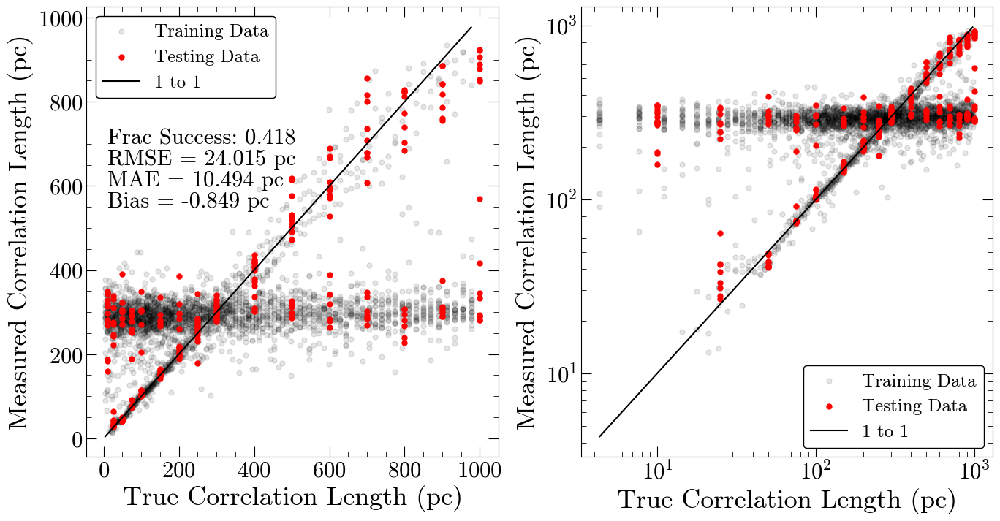

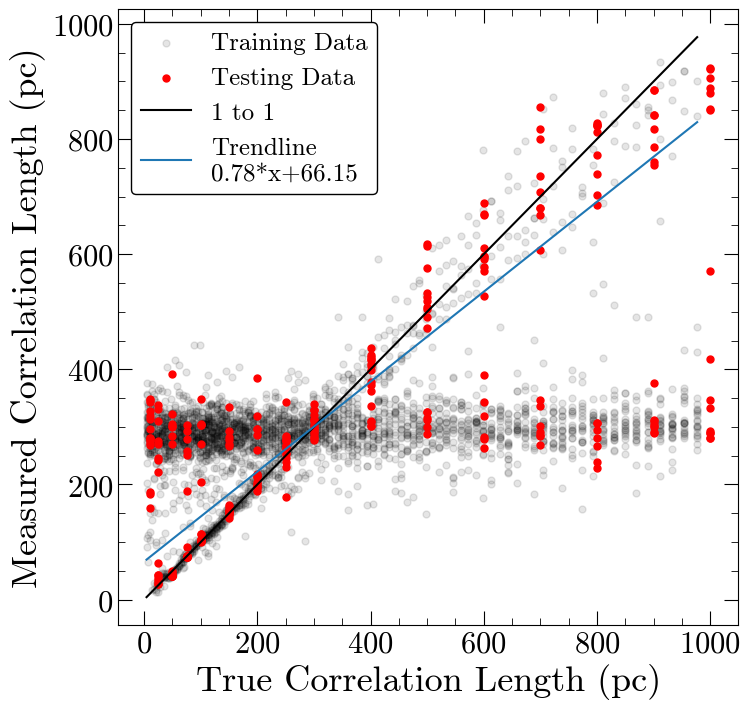

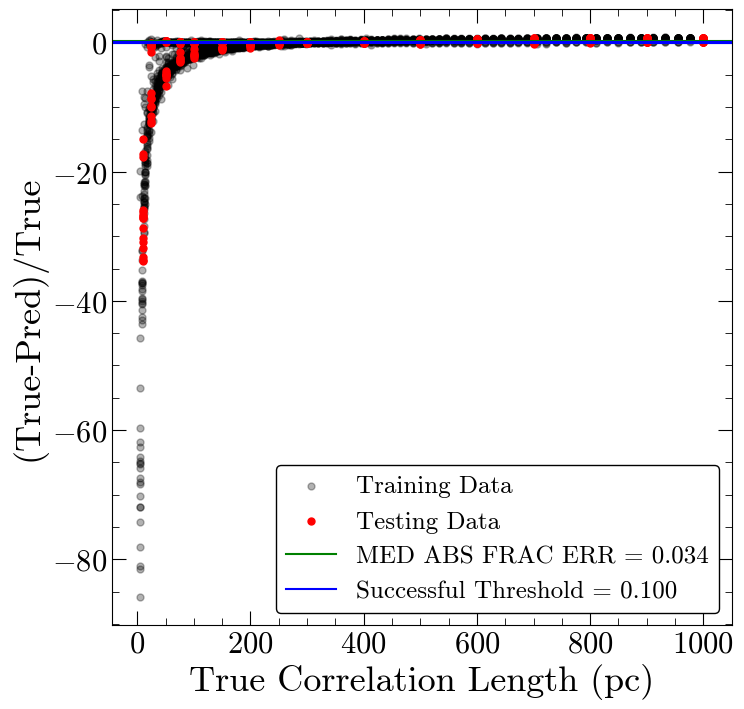

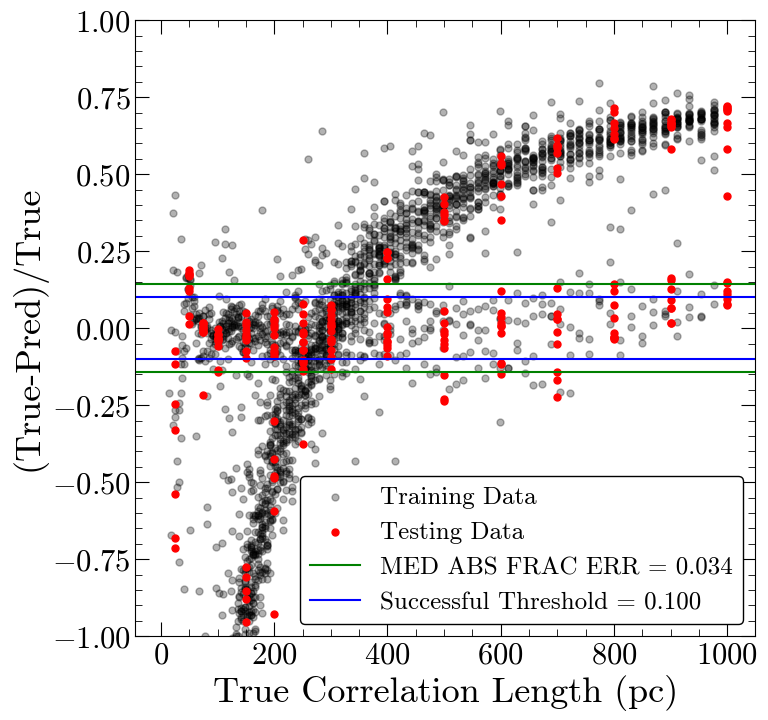

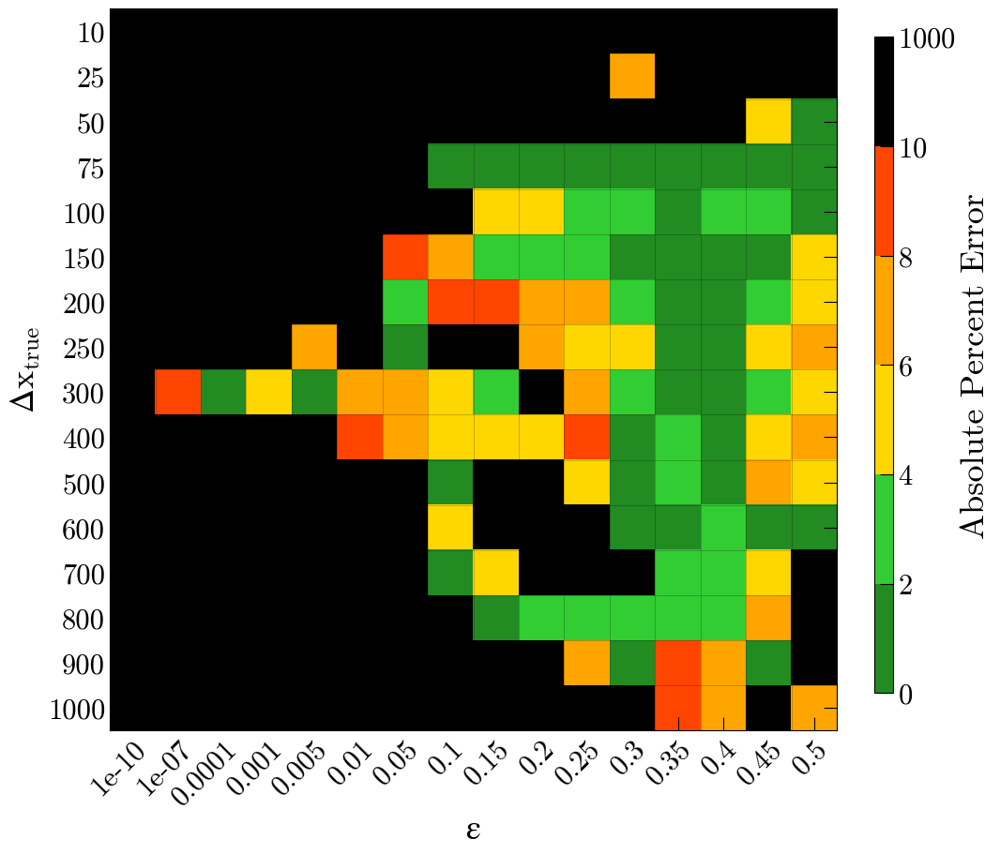

Number of squares with abs percent err>10%,  149


In [29]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [30]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 8

Min MAE Training
8 , min val= 45.06

Max Frac Success Training
8 , max val= 0.33

Min MAE Testing
8 , min val= 43.29

Max Frac Success Testing
8 , max val= 0.47



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,174.53,0.17,108.52,0.33
1,156.78,0.18,91.80,0.38
2,166.28,0.15,82.42,0.31
3,147.34,0.12,90.04,0.22
4,143.28,0.10,77.66,0.20
5,158.77,0.18,76.69,0.38
6,156.74,0.15,70.16,0.30
7,120.25,0.19,76.26,0.38
8,45.06,0.33,43.29,0.47
9,93.18,0.25,56.42,0.43


In [33]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>147:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 3ms/step - loss: 96407.3672
Epoch 2/400
92/92 [==============================] - 0s 4ms/step - loss: 66024.0547
Epoch 3/400
92/92 [==============================] - 0s 4ms/step - loss: 65306.2812
Epoch 4/400
92/92 [==============================] - 0s 4ms/step - loss: 64718.5430
Epoch 5/400
92/92 [==============================] - 0s 4ms/step - loss: 63686.1367
Epoch 6/400
92/92 [==============================] - 0s 5ms/step - loss: 62388.2578
Epoch 7/400
92/92 [==============================] - 1s 6ms/step - loss: 61999.7305
Epoch 8/400
92/92 [==============================] - 0s 5ms/step - loss: 61324.4883
Epoch 9/400
92/92 [==============================] - 0s 4ms/step - loss: 61116.2148
Epoch 10/400
92/92 [==============================] - 0s 4ms/step - loss: 59756.6484
Epoch 11/400
92/92 [==============================] - 0s 4ms/step - loss: 60637.3672
Epoch 12/400
92/92 [==============================] - 0s 4ms/step - loss: 

92/92 [==============================] - 0s 4ms/step - loss: 50837.8438
Epoch 193/400
92/92 [==============================] - 0s 4ms/step - loss: 51093.3008
Epoch 194/400
92/92 [==============================] - 0s 4ms/step - loss: 49988.6289
Epoch 195/400
92/92 [==============================] - 0s 4ms/step - loss: 50011.7969
Epoch 196/400
92/92 [==============================] - 0s 4ms/step - loss: 49177.6836
Epoch 197/400
92/92 [==============================] - 0s 4ms/step - loss: 49484.6641
Epoch 198/400
92/92 [==============================] - 0s 4ms/step - loss: 49236.8477
Epoch 199/400
92/92 [==============================] - 0s 4ms/step - loss: 49596.1602
Epoch 200/400
92/92 [==============================] - 0s 4ms/step - loss: 50371.8555
Epoch 201/400
92/92 [==============================] - 0s 4ms/step - loss: 49188.2852
Epoch 202/400
92/92 [==============================] - 0s 4ms/step - loss: 48907.2227
Epoch 203/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 9200.4551
Epoch 383/400
92/92 [==============================] - 0s 4ms/step - loss: 9742.7646
Epoch 384/400
92/92 [==============================] - 0s 4ms/step - loss: 9601.9883
Epoch 385/400
92/92 [==============================] - 0s 4ms/step - loss: 9896.8721
Epoch 386/400
92/92 [==============================] - 0s 4ms/step - loss: 8920.3330
Epoch 387/400
92/92 [==============================] - 0s 4ms/step - loss: 9022.8301
Epoch 388/400
92/92 [==============================] - 0s 4ms/step - loss: 8845.0391
Epoch 389/400
92/92 [==============================] - 0s 4ms/step - loss: 10308.6113
Epoch 390/400
92/92 [==============================] - 0s 4ms/step - loss: 13751.0342
Epoch 391/400
92/92 [==============================] - 0s 4ms/step - loss: 9864.7275
Epoch 392/400
92/92 [==============================] - 0s 4ms/step - loss: 9479.2432
Epoch 393/400
92/92 [==============================] - 0s 4ms/step - loss: 93

92/92 [==============================] - 0s 4ms/step - loss: 52832.5703
Epoch 174/400
92/92 [==============================] - 0s 4ms/step - loss: 52775.8477
Epoch 175/400
92/92 [==============================] - 0s 5ms/step - loss: 52500.2031
Epoch 176/400
92/92 [==============================] - 0s 5ms/step - loss: 53099.7070
Epoch 177/400
92/92 [==============================] - 0s 4ms/step - loss: 53339.9531
Epoch 178/400
92/92 [==============================] - 0s 4ms/step - loss: 53001.5898
Epoch 179/400
92/92 [==============================] - 0s 4ms/step - loss: 52707.5430
Epoch 180/400
92/92 [==============================] - 0s 4ms/step - loss: 52575.0352
Epoch 181/400
92/92 [==============================] - 0s 5ms/step - loss: 52831.8398
Epoch 182/400
92/92 [==============================] - 0s 4ms/step - loss: 52671.6172
Epoch 183/400
92/92 [==============================] - 0s 4ms/step - loss: 52202.4297
Epoch 184/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 21940.9941
Epoch 364/400
92/92 [==============================] - 0s 4ms/step - loss: 22485.9668
Epoch 365/400
92/92 [==============================] - 0s 4ms/step - loss: 21341.2559
Epoch 366/400
92/92 [==============================] - 0s 4ms/step - loss: 20203.7598
Epoch 367/400
92/92 [==============================] - 0s 4ms/step - loss: 19861.4961
Epoch 368/400
92/92 [==============================] - 0s 4ms/step - loss: 21600.5020
Epoch 369/400
92/92 [==============================] - 0s 4ms/step - loss: 20113.9277
Epoch 370/400
92/92 [==============================] - 0s 4ms/step - loss: 20156.3945
Epoch 371/400
92/92 [==============================] - 0s 4ms/step - loss: 18595.8594
Epoch 372/400
92/92 [==============================] - 0s 4ms/step - loss: 19774.3691
Epoch 373/400
92/92 [==============================] - 0s 4ms/step - loss: 20741.4492
Epoch 374/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 56821.2852
Epoch 60/400
92/92 [==============================] - 0s 4ms/step - loss: 56538.9883
Epoch 61/400
92/92 [==============================] - 0s 4ms/step - loss: 56976.0156
Epoch 62/400
92/92 [==============================] - 0s 4ms/step - loss: 56119.5000
Epoch 63/400
92/92 [==============================] - 0s 4ms/step - loss: 55993.5312
Epoch 64/400
92/92 [==============================] - 0s 4ms/step - loss: 56031.3477
Epoch 65/400
92/92 [==============================] - 0s 4ms/step - loss: 56321.4531
Epoch 66/400
92/92 [==============================] - 0s 4ms/step - loss: 56088.2969
Epoch 67/400
92/92 [==============================] - 0s 4ms/step - loss: 56152.3750
Epoch 68/400
92/92 [==============================] - 0s 4ms/step - loss: 55700.7109
Epoch 69/400
92/92 [==============================] - 0s 4ms/step - loss: 56020.1523
Epoch 70/400
92/92 [==============================] - 0s 4ms/step - loss: 5633

92/92 [==============================] - 0s 4ms/step - loss: 49124.4805
Epoch 250/400
92/92 [==============================] - 0s 4ms/step - loss: 49431.8125
Epoch 251/400
92/92 [==============================] - 0s 4ms/step - loss: 48987.2188
Epoch 252/400
92/92 [==============================] - 0s 4ms/step - loss: 49299.8984
Epoch 253/400
92/92 [==============================] - 0s 4ms/step - loss: 48650.9844
Epoch 254/400
92/92 [==============================] - 0s 4ms/step - loss: 48753.5391
Epoch 255/400
92/92 [==============================] - 0s 4ms/step - loss: 48468.0547
Epoch 256/400
92/92 [==============================] - 0s 4ms/step - loss: 48479.9688
Epoch 257/400
92/92 [==============================] - 0s 4ms/step - loss: 48134.8320
Epoch 258/400
92/92 [==============================] - 0s 4ms/step - loss: 48682.3789
Epoch 259/400
92/92 [==============================] - 0s 4ms/step - loss: 48196.1680
Epoch 260/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 56556.3789
Epoch 40/400
92/92 [==============================] - 0s 4ms/step - loss: 56511.3359
Epoch 41/400
92/92 [==============================] - 0s 4ms/step - loss: 56051.2500
Epoch 42/400
92/92 [==============================] - 0s 4ms/step - loss: 56203.7383
Epoch 43/400
92/92 [==============================] - 0s 4ms/step - loss: 56447.8203
Epoch 44/400
92/92 [==============================] - 0s 4ms/step - loss: 56877.8867
Epoch 45/400
92/92 [==============================] - 0s 5ms/step - loss: 56536.1133
Epoch 46/400
92/92 [==============================] - 0s 4ms/step - loss: 56628.1250
Epoch 47/400
92/92 [==============================] - 0s 4ms/step - loss: 56120.5391
Epoch 48/400
92/92 [==============================] - 0s 4ms/step - loss: 56351.5664
Epoch 49/400
92/92 [==============================] - 0s 4ms/step - loss: 56528.8203
Epoch 50/400
92/92 [==============================] - 0s 4ms/step - loss: 5605

92/92 [==============================] - 0s 4ms/step - loss: 54195.8633
Epoch 136/400
92/92 [==============================] - 0s 4ms/step - loss: 54231.1172
Epoch 137/400
92/92 [==============================] - 0s 4ms/step - loss: 54221.2656
Epoch 138/400
92/92 [==============================] - 0s 4ms/step - loss: 53863.0625
Epoch 139/400
92/92 [==============================] - 0s 4ms/step - loss: 54660.7539
Epoch 140/400
92/92 [==============================] - 0s 4ms/step - loss: 53472.4727
Epoch 141/400
92/92 [==============================] - 0s 4ms/step - loss: 54392.0234
Epoch 142/400
92/92 [==============================] - 0s 4ms/step - loss: 53801.0430
Epoch 143/400
92/92 [==============================] - 0s 4ms/step - loss: 54093.3555
Epoch 144/400
92/92 [==============================] - 0s 4ms/step - loss: 53847.0781
Epoch 145/400
92/92 [==============================] - 0s 4ms/step - loss: 53835.4336
Epoch 146/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 19820.7598
Epoch 326/400
92/92 [==============================] - 0s 4ms/step - loss: 18365.3633
Epoch 327/400
92/92 [==============================] - 0s 4ms/step - loss: 18905.2285
Epoch 328/400
92/92 [==============================] - 0s 4ms/step - loss: 17559.2832
Epoch 329/400
92/92 [==============================] - 0s 4ms/step - loss: 17559.5254
Epoch 330/400
92/92 [==============================] - 0s 4ms/step - loss: 17490.7383
Epoch 331/400
92/92 [==============================] - 0s 4ms/step - loss: 18240.2812
Epoch 332/400
92/92 [==============================] - 0s 4ms/step - loss: 16747.5430
Epoch 333/400
92/92 [==============================] - 0s 4ms/step - loss: 18750.0957
Epoch 334/400
92/92 [==============================] - 0s 4ms/step - loss: 17122.5996
Epoch 335/400
92/92 [==============================] - 0s 4ms/step - loss: 15843.5537
Epoch 336/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 57986.1250
Epoch 22/400
92/92 [==============================] - 0s 4ms/step - loss: 57126.3828
Epoch 23/400
92/92 [==============================] - 0s 4ms/step - loss: 57410.7891
Epoch 24/400
92/92 [==============================] - 0s 4ms/step - loss: 57912.7969
Epoch 25/400
92/92 [==============================] - 0s 4ms/step - loss: 57523.8438
Epoch 26/400
92/92 [==============================] - 0s 4ms/step - loss: 56928.2617
Epoch 27/400
92/92 [==============================] - 0s 4ms/step - loss: 57289.4609
Epoch 28/400
92/92 [==============================] - 0s 4ms/step - loss: 57402.6797
Epoch 29/400
92/92 [==============================] - 0s 4ms/step - loss: 56361.2695
Epoch 30/400
92/92 [==============================] - 0s 4ms/step - loss: 57118.7969
Epoch 31/400
92/92 [==============================] - 0s 4ms/step - loss: 56819.4453
Epoch 32/400
92/92 [==============================] - 0s 4ms/step - loss: 5660

92/92 [==============================] - 0s 4ms/step - loss: 47313.2969
Epoch 213/400
92/92 [==============================] - 0s 4ms/step - loss: 46401.7188
Epoch 214/400
92/92 [==============================] - 0s 5ms/step - loss: 46359.4062
Epoch 215/400
92/92 [==============================] - 0s 4ms/step - loss: 46087.8867
Epoch 216/400
92/92 [==============================] - 0s 4ms/step - loss: 44785.9922
Epoch 217/400
92/92 [==============================] - 0s 4ms/step - loss: 45137.6250
Epoch 218/400
92/92 [==============================] - 0s 4ms/step - loss: 45405.6484
Epoch 219/400
92/92 [==============================] - 0s 4ms/step - loss: 45195.5234
Epoch 220/400
92/92 [==============================] - 0s 4ms/step - loss: 44301.1211
Epoch 221/400
92/92 [==============================] - 0s 4ms/step - loss: 44822.7656
Epoch 222/400
92/92 [==============================] - 0s 4ms/step - loss: 44182.6289
Epoch 223/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 65714.4062
Epoch 3/400
92/92 [==============================] - 0s 4ms/step - loss: 64304.3672
Epoch 4/400
92/92 [==============================] - 0s 4ms/step - loss: 62957.4141
Epoch 5/400
92/92 [==============================] - 0s 4ms/step - loss: 61927.7344
Epoch 6/400
92/92 [==============================] - 0s 4ms/step - loss: 60587.9023
Epoch 7/400
92/92 [==============================] - 0s 4ms/step - loss: 60214.3320
Epoch 8/400
92/92 [==============================] - 0s 4ms/step - loss: 59581.5039
Epoch 9/400
92/92 [==============================] - 0s 4ms/step - loss: 58651.1289
Epoch 10/400
92/92 [==============================] - 0s 4ms/step - loss: 58454.3086
Epoch 11/400
92/92 [==============================] - 0s 4ms/step - loss: 59140.0273
Epoch 12/400
92/92 [==============================] - 0s 4ms/step - loss: 58521.0312
Epoch 13/400
92/92 [==============================] - 0s 4ms/step - loss: 58337.5078


92/92 [==============================] - 0s 4ms/step - loss: 48331.2188
Epoch 194/400
92/92 [==============================] - 0s 4ms/step - loss: 47734.4688
Epoch 195/400
92/92 [==============================] - 0s 4ms/step - loss: 48035.8633
Epoch 196/400
92/92 [==============================] - 0s 4ms/step - loss: 47429.8828
Epoch 197/400
92/92 [==============================] - 0s 4ms/step - loss: 47402.8789
Epoch 198/400
92/92 [==============================] - 0s 4ms/step - loss: 47202.5781
Epoch 199/400
92/92 [==============================] - 0s 4ms/step - loss: 47146.3359
Epoch 200/400
92/92 [==============================] - 0s 4ms/step - loss: 47739.7539
Epoch 201/400
92/92 [==============================] - 0s 4ms/step - loss: 47690.2148
Epoch 202/400
92/92 [==============================] - 0s 4ms/step - loss: 46477.5508
Epoch 203/400
92/92 [==============================] - 0s 4ms/step - loss: 46154.3945
Epoch 204/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 9679.1465
Epoch 384/400
92/92 [==============================] - 0s 4ms/step - loss: 7634.6387
Epoch 385/400
92/92 [==============================] - 0s 4ms/step - loss: 7050.6416
Epoch 386/400
92/92 [==============================] - 0s 4ms/step - loss: 7500.0107
Epoch 387/400
92/92 [==============================] - 0s 4ms/step - loss: 7583.1831
Epoch 388/400
92/92 [==============================] - 0s 4ms/step - loss: 7372.8916
Epoch 389/400
92/92 [==============================] - 0s 4ms/step - loss: 7649.1997
Epoch 390/400
92/92 [==============================] - 0s 4ms/step - loss: 7778.1060
Epoch 391/400
92/92 [==============================] - 0s 4ms/step - loss: 8267.8047
Epoch 392/400
92/92 [==============================] - 0s 4ms/step - loss: 9169.8018
Epoch 393/400
92/92 [==============================] - 0s 4ms/step - loss: 7546.4321
Epoch 394/400
92/92 [==============================] - 0s 4ms/step - loss: 6863

92/92 [==============================] - 0s 4ms/step - loss: 53374.1055
Epoch 175/400
92/92 [==============================] - 0s 4ms/step - loss: 53056.5352
Epoch 176/400
92/92 [==============================] - 0s 4ms/step - loss: 52877.9414
Epoch 177/400
92/92 [==============================] - 0s 3ms/step - loss: 53098.0664
Epoch 178/400
92/92 [==============================] - 0s 3ms/step - loss: 54097.3984
Epoch 179/400
92/92 [==============================] - 0s 4ms/step - loss: 52817.9180
Epoch 180/400
92/92 [==============================] - 0s 4ms/step - loss: 52417.6797
Epoch 181/400
92/92 [==============================] - 0s 3ms/step - loss: 53280.4219
Epoch 182/400
92/92 [==============================] - 0s 4ms/step - loss: 52923.4766
Epoch 183/400
92/92 [==============================] - 0s 4ms/step - loss: 52353.2891
Epoch 184/400
92/92 [==============================] - 0s 4ms/step - loss: 52979.6250
Epoch 185/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 24513.9004
Epoch 365/400
92/92 [==============================] - 0s 3ms/step - loss: 24942.0312
Epoch 366/400
92/92 [==============================] - 0s 4ms/step - loss: 27015.8379
Epoch 367/400
92/92 [==============================] - 0s 3ms/step - loss: 24314.6406
Epoch 368/400
92/92 [==============================] - 0s 3ms/step - loss: 23475.1133
Epoch 369/400
92/92 [==============================] - 0s 3ms/step - loss: 22926.7930
Epoch 370/400
92/92 [==============================] - 0s 3ms/step - loss: 23658.8789
Epoch 371/400
92/92 [==============================] - 0s 3ms/step - loss: 22103.2812
Epoch 372/400
92/92 [==============================] - 0s 3ms/step - loss: 21897.1738
Epoch 373/400
92/92 [==============================] - 0s 3ms/step - loss: 24866.7051
Epoch 374/400
92/92 [==============================] - 0s 3ms/step - loss: 22335.3574
Epoch 375/400
92/92 [==============================] - 0s 3ms/step -

In [34]:
#save the model
nb='11'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/11_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/11_final_model/assets


In [35]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

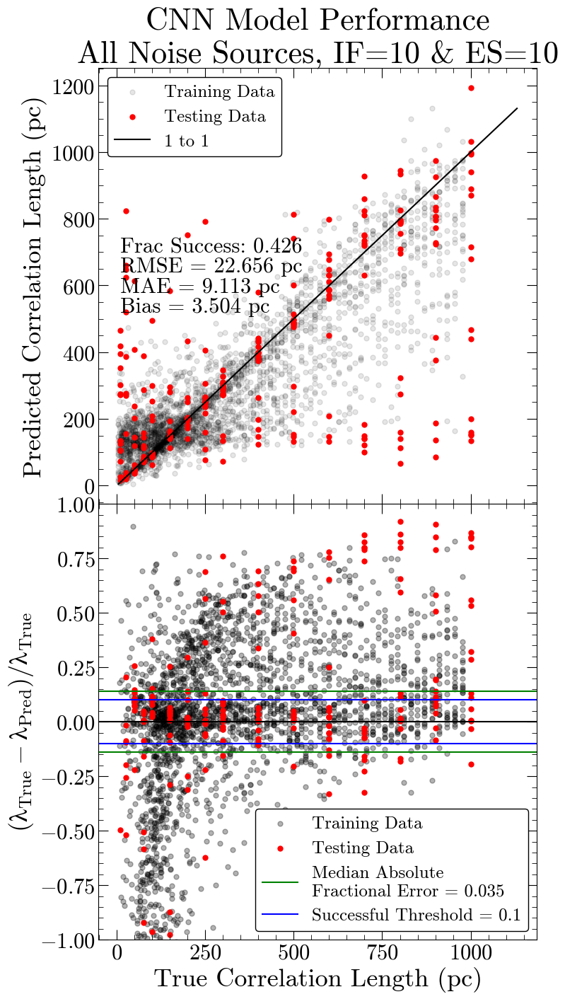

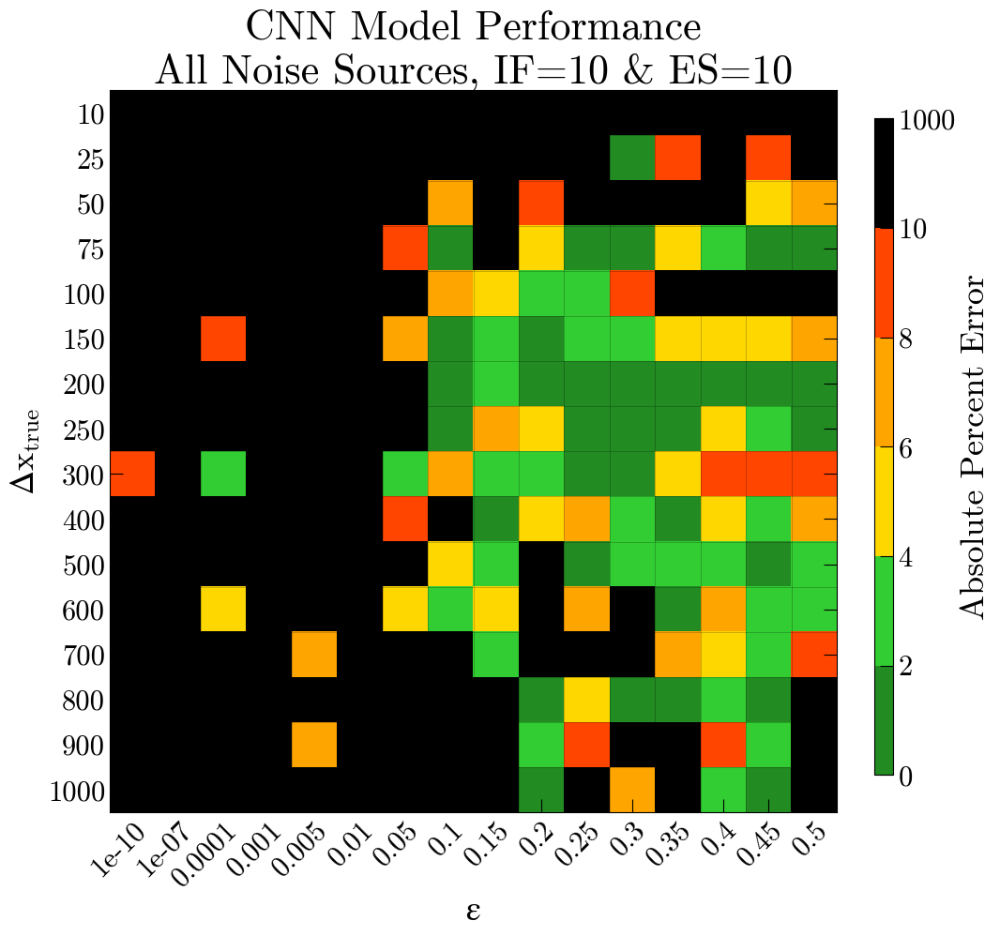

Number of squares with abs percent err>10%,  147


In [36]:
final_plot('11','CNN Model Performance\nAll Noise Sources, IF=10 & ES=10',statdy=60)